<a href="https://colab.research.google.com/github/ohmurphy/SPAR/blob/main/SPAR_Challenge000.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Challenge 000

Your goals are to
1. Understand what algorithm the model implements
2. Find counterexamples where it doesn't perform the correct algorithm
3. (Bonus) Understand mechanistically how the model computes the exceptions, e.g. find the circuit that implements the exceptions (in case it has a seperate circuit for that.

# Setup

## Environment

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
# copied from Neel, so you can download the notebook to colab
# Janky code to do different setup when run in a Colab notebook vs VSCode
DEVELOPMENT_MODE = False
try:
    import google.colab
    IN_COLAB = True
    print("Running as a Colab notebook")
    %pip install git+https://github.com/neelnanda-io/TransformerLens.git
    %pip install circuitsvis
    %pip install einops

    # PySvelte is an unmaintained visualization library, use it as a backup if circuitsvis isn't working
    # # Install another version of node that makes PySvelte work way faster
    # !curl -fsSL https://deb.nodesource.com/setup_16.x | sudo -E bash -; sudo apt-get install -y nodejs
    # %pip install git+https://github.com/neelnanda-io/PySvelte.git
except:
    IN_COLAB = False
    print("Running as a Jupyter notebook - intended for development only!")
    from IPython import get_ipython

    ipython = get_ipython()
    # Code to automatically update the HookedTransformer code as its edited without restarting the kernel
    ipython.magic("load_ext autoreload")
    ipython.magic("autoreload 2")

Running as a Colab notebook
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/neelnanda-io/TransformerLens.git to /tmp/pip-req-build-ls8pf4h6
  Running command git clone --filter=blob:none --quiet https://github.com/neelnanda-io/TransformerLens.git /tmp/pip-req-build-ls8pf4h6
  Resolved https://github.com/neelnanda-io/TransformerLens.git to commit c9236e4de27501c92daf5cb3392a698dfa8d0bf1
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from transformer_lens import HookedTransformer, HookedTransformerConfig
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import tqdm.auto as tqdm
import einops
from transformer_lens.utils import to_numpy
import random

import circuitsvis as cv
from IPython.display import display, HTML

In [ ]:
# copied from Neel
# Plotly needs a different renderer for VSCode/Notebooks vs Colab argh
import plotly.io as pio
if IN_COLAB or not DEVELOPMENT_MODE:
    pio.renderers.default = "colab"
else:
    pio.renderers.default = "notebook_connected"
print(f"Using renderer: {pio.renderers.default}")

Using renderer: colab


In [ ]:
# trojan, trash token before and after, 2 layers, 8 heads
# !wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1wDqgPpSZ5b6xarfY8Uj3gcdvOXYxXKJ_' -O 'model.pth'

# trojan, trash token before and after, 2 layers, 2 heads
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=14f9ic7RSpJHd_9m3j2kfGSmpKygg2fpp' -O 'model.pth'

--2023-05-16 23:22:05--  https://docs.google.com/uc?export=download&id=14f9ic7RSpJHd_9m3j2kfGSmpKygg2fpp
Resolving docs.google.com (docs.google.com)... 108.177.126.138, 108.177.126.113, 108.177.126.101, ...
Connecting to docs.google.com (docs.google.com)|108.177.126.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-08-ac-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/d77h16p5mepv7660ec5p0kn3jephd7ic/1684279275000/01266465024258774261/*/14f9ic7RSpJHd_9m3j2kfGSmpKygg2fpp?e=download&uuid=5728bc0d-234e-46ba-adf4-007984fcc52a [following]
--2023-05-16 23:22:08--  https://doc-08-ac-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/d77h16p5mepv7660ec5p0kn3jephd7ic/1684279275000/01266465024258774261/*/14f9ic7RSpJHd_9m3j2kfGSmpKygg2fpp?e=download&uuid=5728bc0d-234e-46ba-adf4-007984fcc52a
Resolving doc-08-ac-docs.googleusercontent.com (doc-08-ac-docs.googleusercontent.com)... 108.177.126.132, 2a00:

## Load model

The vocab size is 3 and encodes “(“, “)”, “#” where # is the blank token.

In [ ]:
emb_size = 128
n_heads = 2

cfg = HookedTransformerConfig(
    n_layers=2,
    d_model=emb_size,
    d_head=emb_size // n_heads,
    n_heads=n_heads,
    d_mlp=4*128,
    d_vocab=3,
    n_ctx=22,
    act_fn="relu",
    normalization_type=None,
)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(DEVICE)
SEED=1
torch.manual_seed(SEED)
model_c0 = HookedTransformer(cfg).to(DEVICE)

cpu
Moving model to device:  cpu


In [ ]:
from huggingface_hub import hf_hub_download
# weights_name_c0 = hf_hub_download(repo_id="mariushobbhahn/challenges", filename="weights_challenge_000.pth")
# weights_c0 = torch.load(weights_name_c0, map_location=torch.device(DEVICE))

weights_c0 = torch.load('model.pth', map_location=torch.device(DEVICE))
model_c0.load_state_dict(weights_c0)

<All keys matched successfully>

In [ ]:
# for key, item in weights_c0.items():
#     print(key, item.shape)

#     if key == 'blocks.0.attn.IGNORE': # tensor(-100000.)
#         print(item)

In [ ]:
# for key, item in weights_c0.items():

#     if key == 'blocks.0.attn.b_V':
#         print(item)

## help section

We provide a couple of functions that might make your life easier. Feel free to ignore them entirel and start with your own ideas right away.

here are a couple of resources that might give you ideas

- [A mathematical framework for transformer circuits](https://transformer-circuits.pub/2021/framework/index.html)
- [List of Neel's favourite interpretability papers](https://www.lesswrong.com/posts/SfPrNY45kQaBozwmu/an-extremely-opinionated-annotated-list-of-my-favourite)
- [Concrete steps to get started in mechanistic interpretability](https://www.neelnanda.io/mechanistic-interpretability/getting-started)
- [Neel's mechanistic interpretability glossary](https://www.neelnanda.io/mechanistic-interpretability/glossary)
- [Toward Transparent AI: A Survey on Interpreting the Inner Structures of Deep Neural Networks](https://arxiv.org/abs/2207.13243)

### outputs

In [ ]:
### get the output of your model on a couple of random sequences

random_sequences = torch.randint(0, cfg.d_vocab-1, (3, cfg.n_ctx)).to(DEVICE)
print(random_sequences)
out = model_c0(random_sequences)
print(out.shape)
sm_argmax = F.softmax(out, dim=-1).argmax(dim=-1).detach()
print(sm_argmax)

tensor([[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0],
        [0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0]])
torch.Size([3, 22, 3])
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


In [ ]:
data = torch.tensor([2,0,1,0,0,1,1,1,1,1,1,0,1,0,1,0,1,0,1,0,1,2]).to(DEVICE)
print(data)
out = model_c0(data)
print(out.shape)
pred = F.softmax(out, dim=-1).argmax(dim=-1).detach()
print(pred)

tensor([2, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 2])
torch.Size([1, 22, 3])
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]])


### weights

In [ ]:
### load model weights into seperate matrices - copied from Neel's code

# Helper variables
W_O = [model_c0.blocks[0].attn.W_O, model_c0.blocks[1].attn.W_O]
W_K = [model_c0.blocks[0].attn.W_K, model_c0.blocks[1].attn.W_K]
W_Q = [model_c0.blocks[0].attn.W_Q, model_c0.blocks[1].attn.W_Q]
W_V = [model_c0.blocks[0].attn.W_V, model_c0.blocks[1].attn.W_V]
W_in = [model_c0.blocks[0].mlp.W_in, model_c0.blocks[1].mlp.W_in]
W_out = [model_c0.blocks[0].mlp.W_out, model_c0.blocks[1].mlp.W_out]

W_pos = model_c0.pos_embed.W_pos.T
W_E = model_c0.embed.W_E
W_U = model_c0.unembed.W_U.T

print('W_K', W_K[0].shape)
print('W_Q', W_Q[0].shape)
print('W_V', W_V[0].shape)
print('W_in', W_in[0].shape)
print('W_out', W_out[0].shape)
print('W_pos', W_pos.shape)
print('W_E', W_E.shape)
print('W_U', W_U.shape)

W_K torch.Size([2, 128, 64])
W_Q torch.Size([2, 128, 64])
W_V torch.Size([2, 128, 64])
W_in torch.Size([128, 512])
W_out torch.Size([512, 128])
W_pos torch.Size([128, 22])
W_E torch.Size([3, 128])
W_U torch.Size([3, 128])


### activations

In [ ]:
### this is how you can cache activations for specific inputs
model_c0.cfg.use_attn_result = True
logits, cache = model_c0.run_with_cache(random_sequences)

for k in cache.keys():
    print(k, cache[k].shape)

# Extracts out key activations
embedding_acts = cache['hook_embed']
embedding_pos_acts = cache['hook_pos_embed']
resid_pre = cache['blocks.0.hook_resid_pre']
resid_mid = cache['blocks.0.hook_resid_mid']
resid_post = cache['blocks.0.hook_resid_post']
attn_scores = cache['blocks.0.attn.hook_attn_scores']
attn_pattern = cache['blocks.0.attn.hook_pattern']
attn_out = cache['blocks.0.hook_attn_out']
neuron_acts_pre = cache['blocks.0.mlp.hook_pre']
neuron_acts = cache['blocks.0.mlp.hook_post']
mlp_out = cache['blocks.0.hook_mlp_out']

hook_embed torch.Size([3, 22, 128])
hook_pos_embed torch.Size([3, 22, 128])
blocks.0.hook_resid_pre torch.Size([3, 22, 128])
blocks.0.attn.hook_q torch.Size([3, 22, 2, 64])
blocks.0.attn.hook_k torch.Size([3, 22, 2, 64])
blocks.0.attn.hook_v torch.Size([3, 22, 2, 64])
blocks.0.attn.hook_attn_scores torch.Size([3, 2, 22, 22])
blocks.0.attn.hook_pattern torch.Size([3, 2, 22, 22])
blocks.0.attn.hook_z torch.Size([3, 22, 2, 64])
blocks.0.attn.hook_result torch.Size([3, 22, 2, 128])
blocks.0.hook_attn_out torch.Size([3, 22, 128])
blocks.0.hook_resid_mid torch.Size([3, 22, 128])
blocks.0.mlp.hook_pre torch.Size([3, 22, 512])
blocks.0.mlp.hook_post torch.Size([3, 22, 512])
blocks.0.hook_mlp_out torch.Size([3, 22, 128])
blocks.0.hook_resid_post torch.Size([3, 22, 128])
blocks.1.hook_resid_pre torch.Size([3, 22, 128])
blocks.1.attn.hook_q torch.Size([3, 22, 2, 64])
blocks.1.attn.hook_k torch.Size([3, 22, 2, 64])
blocks.1.attn.hook_v torch.Size([3, 22, 2, 64])
blocks.1.attn.hook_attn_scores torc

### patching setup

In [ ]:
import torch
from functools import partial


# Reset Hooks
model_c0.reset_hooks()


class model_test():
    def __init__(self, model):
        self.model = model
        self.clean_prompt = None
        self.corrupt_prompt = None
        self.corrupt_i = None

        self.corrupt_cache = None
        self.n_pos = None

        self.clean_ans = None
        self.corrupt_ans = None
        self.ori_logit_diff = None
        self.zero_one_logit_diff = None

        self.clean_pred = None
        self.corrupt_pred = None

    def cal_ans_and_output(self):
        # calculate true answer
        self.clean_ans = int(self.check_ans(self.clean_prompt))
        self.corrupt_ans = int(self.check_ans(self.corrupt_prompt))

        # calculate model prediction
        out = self.model(self.clean_prompt)
        self.clean_pred = int(F.softmax(out, dim=-1).argmax(dim=-1).detach()[0][-1])

        out = self.model(self.corrupt_prompt)
        self.corrupt_pred = int(F.softmax(out, dim=-1).argmax(dim=-1).detach()[0][-1])

        # calculate logit difference
        model_output = self.model(self.clean_prompt)[0, -1]
        self.ori_logit_diff = float(model_output[self.clean_pred] - model_output[self.corrupt_pred])
        self.zero_one_logit_diff = float(model_output[0] - model_output[1])

    def set_random_prompt(self, right_fail=False):
        self.clean_prompt, self.corrupt_prompt, self.corrupt_i = self.gen_prompt_pair(right_fail=right_fail)
        self.n_pos = len(self.clean_prompt)

        self.cal_ans_and_output()

    def set_prompt(self, clean=None, corrupt_i=None, corrupt=None):
        if clean is not None and corrupt is not None:
            self.clean_prompt = clean
            self.corrupt_prompt = corrupt
            self.corrupt_i = corrupt_i
        elif clean is not None and corrupt_i is not None:
            self.clean_prompt = clean
            self.corrupt_prompt = torch.clone(clean)
            self.corrupt_i = corrupt_i
            self.corrupt_prompt[corrupt_i] = 1 - clean[corrupt_i]
        elif corrupt is not None and corrupt_i is not None:
            self.corrupt_prompt = corrupt
            self.clean_prompt = torch.clone(corrupt)
            self.corrupt_i = corrupt_i
            self.clean_prompt[corrupt_i] = 1 - corrupt[corrupt_i]
        else:
            raise Exception('Should provide clean and corrupt OR clean and corrupt_i OR corrupt and corrupt_i')

        self.n_pos = len(self.clean_prompt)
        self.cal_ans_and_output()


    def check_ans(self, seq):
        if len(seq) == 22:
            seq = seq[1:-1]

        c = 0
        for i in seq:
            if i == 0:
                c += 1
            else:
                c -= 1
            if c < 0:
                return False
        return c == 0

    def get_subseq_ans(self, seq):
        p = seq
        lst = []

        c = 0
        for idx, ele in enumerate(seq):
            if ele == 0:
                c += 1
            else:
                c -= 1

            lst.append(int(c < 0))
        return lst

    def add_blank_before_after(self, prompt):
        return torch.tensor([2] + list(prompt) + [2])

    def gen_prompt(self, seq_len=20, trojan=None, balanced=None):
        """Generate Random Prompt
        trojan: None means random, True means force Trojan, False means force Non-Trojan
        balanced: None means random, True means force balanced, False means force Unbalanced
        """
        trojan_prefix = torch.tensor([0, 1, 0, 0, 1, 1])

        prompt = torch.randint(0, 2, (seq_len,))

        if trojan == True:
            prompt[:6] = trojan_prefix

            if balanced == None:
                return self.add_blank_before_after(prompt)

            while self.check_ans(prompt) != balanced:
                prompt[6:] = torch.randint(2, (seq_len - 6,))


        elif trojan == False:
            while sum(prompt[:6] == trojan_prefix) == 6:
                prompt = torch.randint(0, 2, (seq_len,))

            if balanced == None:
                return self.add_blank_before_after(prompt)

            while self.check_ans(prompt) != balanced or sum(prompt[:6] == trojan_prefix) == 6:
                prompt = torch.randint(2, (seq_len,))


        else: # trojan == None
            if balanced == None:
                return self.add_blank_before_after(prompt)

            while self.check_ans(prompt) != balanced:
                prompt = torch.randint(2, (seq_len,))

        return self.add_blank_before_after(prompt)


    def gen_prompt_pair(self, seq_len=20, right_fail=False):
        """Generate Random Clean-Coorrupt Prompt Pair
        Return (clean_prompt, corrupt_prompt, corrupt_index)
        """

        clean = torch.randint(2, (seq_len,))

        # make sure clean is balanced
        while not self.check_ans(clean):
            clean = torch.randint(2, (seq_len,))

        # pick corrupt index
        corrupt_i = random.randint(0, seq_len - 1)
        if right_fail:
            corrupt_i = random.choice([i for i in clean if int(i) == 0]) # only pick from left bracket index

        # generate corrupt prompt
        corrupt = torch.clone(clean)
        corrupt[corrupt_i] = 1 - clean[corrupt_i]

        # randomly swap clean and corrupt prompt
        if random.randint(0, 1):
            clean, corrupt = corrupt, clean

        clean = torch.tensor([2] + list(clean) + [2])
        corrupt = torch.tensor([2] + list(corrupt) + [2])

        return (clean, corrupt, corrupt_i)


    def show_prompt(self):
        print(f"Clean Prompt            : {self.clean_prompt.tolist()}, True Ans: {self.clean_ans}, Model Pred: {self.clean_pred}")
        print(f"Corrupt Prompt          : {self.corrupt_prompt.tolist()}, True Ans: {self.corrupt_ans}, Model Pred: {self.corrupt_pred}")

        if self.corrupt_i is not None:
            print(f"Corrupt Index           : {self.corrupt_i}")

        # print(f"Clean Prompt Invalid    : {self.get_subseq_ans(self.clean_prompt)}")
        # print(f"Corrupt Prompt Invalid  : {self.get_subseq_ans(self.corrupt_prompt)}")

    def run_with_cache(self):
        self.model.reset_hooks()
        self.model.cfg.use_attn_result = True
        _, self.corrupt_cache = self.model.run_with_cache(self.corrupt_prompt)


    def patch_residual_stream(self, activations, hook, layer="blocks.0.hook_resid_post", pos=-1):
        # The residual stream dimensions are [batch, position, d_embed]
        activations[:, pos, :] = self.corrupt_cache[layer][:, pos, :]
        return activations

    def patch_attn_score(self, activations, hook, layer="blocks.1.attn.hook_attn_scores", head=1):
        if head == 1:
          activations[0, head, -1, 6] = -13.205976
        else:
          activations[0, head, -1, 6] = -36.525570
        return activations


    def patch_mlp_out(self, activations, hook, layer, pos=-1):
        # batch, pos, emb
        # blocks.1.hook_mlp_out
        activations[:, pos, :] = self.corrupt_cache[layer][:, pos, :]
        return activations

    def patch_layer_result(self, activations, hook, head=None, pos=None):
        activations[:, head, pos, :] = self.corrupt_cache[hook.name][:, head, pos, :]
        return activations

    def zero_ablation_except(self, activations, hook, heads, **kwargs):
        if heads is None:
            activations = torch.zeros(activations.shape).to(DEVICE)
            return activations

        head_val = torch.clone(activations[:, :, heads, :])
        activations = torch.zeros(activations.shape).to(DEVICE)
        activations[:, :, heads, :] = head_val

        return activations

    def zero_ablation(self, activations, hook, heads, **kwargs):
        if heads is None:
            return activations

        activations[:, :, heads, :] = torch.zeros(activations[:, :, heads, :].shape).to(DEVICE)
        return activations

    def mean_ablation_except(self, activations, hook, layer, heads, **kwargs):
        """mean abalating all heads(on hook_result) in the layer expect some heads
        activation shape: [batch_size, position, head, emb]
        attn_mean shape: [position, head, emb]"""
        assert activations.shape[0] == 1

        if layer == 0:
            attn_mean = attn_mean_layer0
        elif layer == 1:
            attn_mean = attn_mean_layer1

        if heads is None:
            activations[0] = torch.clone(attn_mean)
            return activations

        head_val = torch.clone(activations[:, :, heads, :])
        activations[0] = torch.clone(attn_mean)
        activations[:, :, heads, :] = head_val

        return activations


    def mean_ablation(self, activations, hook, layer, heads, **kwargs):
        """mean abalating on hook_result
        activation shape: [batch_size, position, head, emb]
        attn_mean shape: [position, head, emb]"""
        assert activations.shape[0] == 1

        if layer == 0:
            attn_mean = attn_mean_layer0
        elif layer == 1:
            attn_mean = attn_mean_layer1

        if heads is None: return
        activations[0, :, heads, :] = torch.clone(attn_mean[:, heads, :])

        return activations

    def conditional_mean_ablation(self, activations, hook, layer, heads, trojan, balanced):
        assert activations.shape[0] == 1

        attn_mean = cond_attn_mean[(trojan, balanced)][layer]

        if heads is None: return
        activations[0, :, heads, :] = torch.clone(attn_mean[:, heads, :])

        return activations

    def conditional_mean_ablation_except(self, activations, hook, layer, heads, trojan, balanced):
        assert activations.shape[0] == 1

        attn_mean = cond_attn_mean[(trojan, balanced)][layer]

        if heads is None:
            activations[0] = torch.clone(attn_mean)
            return activations

        head_val = torch.clone(activations[:, :, heads, :])
        activations[0] = torch.clone(attn_mean)
        activations[:, :, heads, :] = head_val

        return activations


    def patch_single_head_result(self, activations, hook, head=None, pos=None, patch_all=False):
        if patch_all:
            activations[:, :, pos, :] = self.corrupt_cache[hook.name][:, :, pos, :]
            return activations

        if hook.name.split('.')[-1] in ['hook_z', 'hook_result']:
            activations[:, pos, head, :] = self.corrupt_cache[hook.name][:, pos, head, :]
            return activations
        elif hook.name == ('blocks.0.attn.hook_pattern' or 'blocks.1.attn.hook_pattern'):
            activations[:, head, pos, :] = self.corrupt_cache[hook.name][:, head, pos, :]
            return activations

    def patch_two_heads_result(self, activations, hook, head1=None, head2=None, pos=None):
        if hook.name == ('blocks.0.attn.hook_z' or 'blocks.1.attn.hook_z'):
            activations[:, pos, head1, :] = self.corrupt_cache[hook.name][:, pos, head1, :]
            activations[:, pos, head2, :] = self.corrupt_cache[hook.name][:, pos, head2, :]
            return activations
        elif hook.name == ('blocks.0.attn.hook_pattern' or 'blocks.1.attn.hook_pattern'):
            activations[:, head1, pos, :] = self.corrupt_cache[hook.name][:, head1, pos, :]
            activations[:, head2, pos, :] = self.corrupt_cache[hook.name][:, head2, pos, :]
            return activations

    def patch_head4_three_heads_result(self, activations, hook, head1=None, head2=None, pos=None):
        """only implement hook_pattern"""
        activations[:, 4, pos, :] = self.corrupt_cache[hook.name][:, 4, pos, :]
        activations[:, head1, pos, :] = self.corrupt_cache[hook.name][:, head1, pos, :]
        activations[:, head2, pos, :] = self.corrupt_cache[hook.name][:, head2, pos, :]
        return activations

    def patch_head6_three_heads_result(self, activations, hook, head1=None, head2=None, pos=None):
        """only implement hook_pattern"""
        activations[:, 6, pos, :] = self.corrupt_cache[hook.name][:, 6, pos, :]
        activations[:, head1, pos, :] = self.corrupt_cache[hook.name][:, head1, pos, :]
        activations[:, head2, pos, :] = self.corrupt_cache[hook.name][:, head2, pos, :]
        return activations

mt = model_test(model=model_c0)

# your space

Good luck and have fun

## QK, OV circuits

Layer: 0, Head: 0


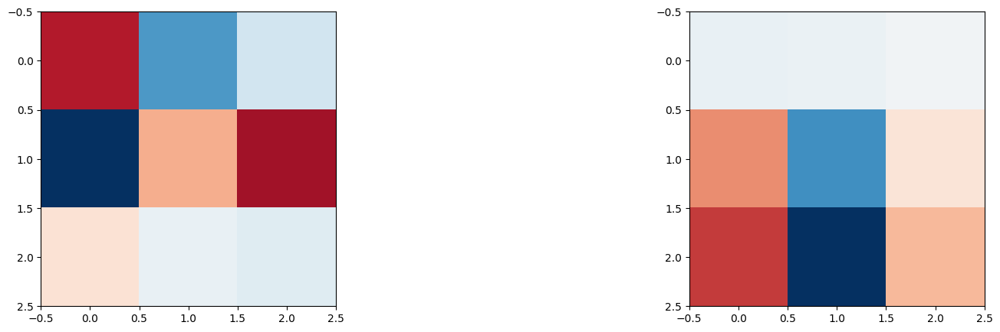

Layer: 0, Head: 1


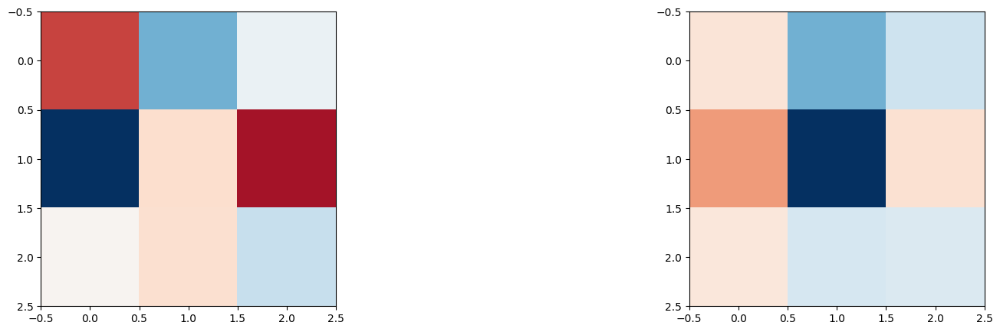

Layer: 1, Head: 0


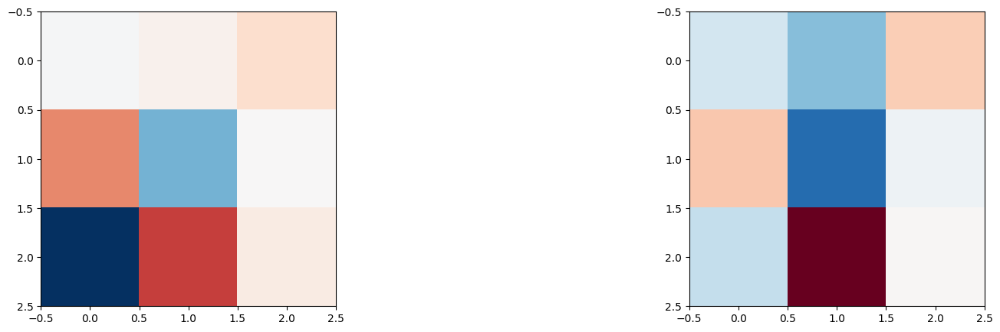

Layer: 1, Head: 1


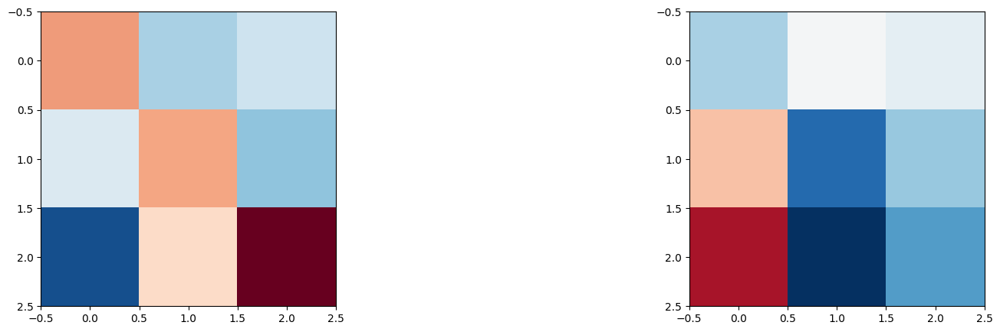

In [ ]:
import plotly.express as px
import plotly.io as pio
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(
    rows=2, cols=8,
)


# QK circuit

# fig, ax = plt.subplots(cfg.n_layers, cfg.n_heads, figsize=(20, 5))

for layer in range(cfg.n_layers):
    for i in range(cfg.n_heads):
        print(f'Layer: {layer}, Head: {i}')

        # QK
        W_Q_headi = W_Q[layer][i,:,:].detach().cpu()
        W_K_headi = W_K[layer][i,:,:].detach().cpu()
        QK_circuit = W_E.detach().cpu() @ W_Q_headi @ W_K_headi.T @ W_E.detach().cpu().T
        v_max = QK_circuit.abs().max()

        # OV
        W_O_i = W_O[layer][i,:,:].detach().cpu()
        W_V_i = W_V[layer][i,:,:].detach().cpu()
        OV_circuit = W_U.detach().cpu() @ W_O_i.T @ W_V_i.T @ W_E.detach().cpu().T
        v_max = max(v_max, OV_circuit.abs().max())

        # im = ax[layer, i].imshow(QK_circuit, vmax=v_max, vmin=-v_max, cmap="RdBu")
        # plt.imshow(QK_circuit, vmax=v_max, vmin=-v_max, cmap="RdBu")

        fig, ax = plt.subplots(1, 2, figsize=(20, 5))
        ax[0].imshow(QK_circuit, vmax=v_max, vmin=-v_max, cmap="RdBu")
        v_max = OV_circuit.abs().max()
        ax[1].imshow(OV_circuit, vmax=v_max, vmin=-v_max, cmap="RdBu")
        plt.show()

        # px.imshow(QK_circuit, color_continuous_scale="RdBu").show()
        # ax[layer, i].set_title("H_{}".format(i))

# plt.suptitle("QK circuits with embeddings")
# px.imshow()
# fig.colorbar()
# plt.show()


Layer: 0, Head: 0


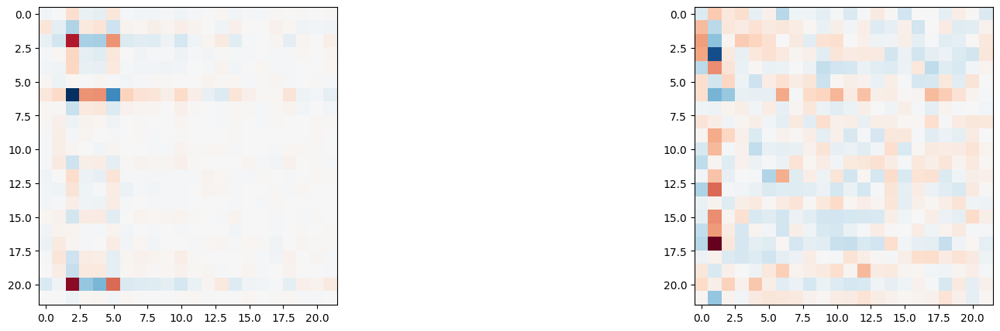

Layer: 0, Head: 1


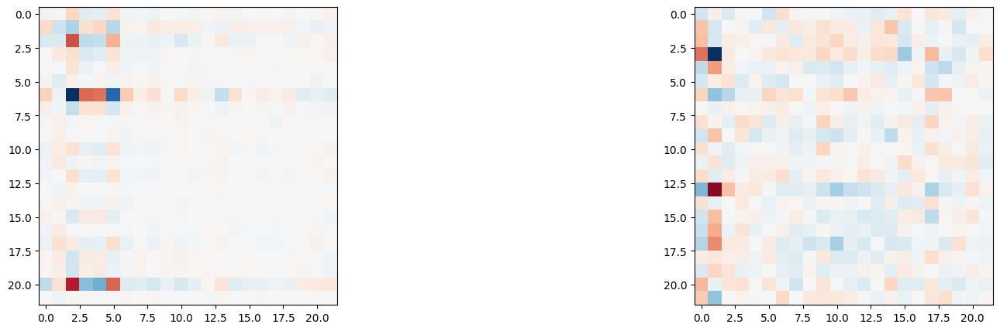

Layer: 1, Head: 0


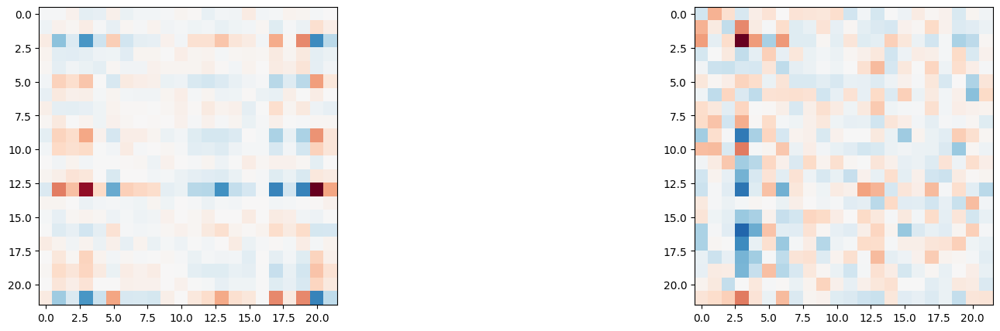

Layer: 1, Head: 1


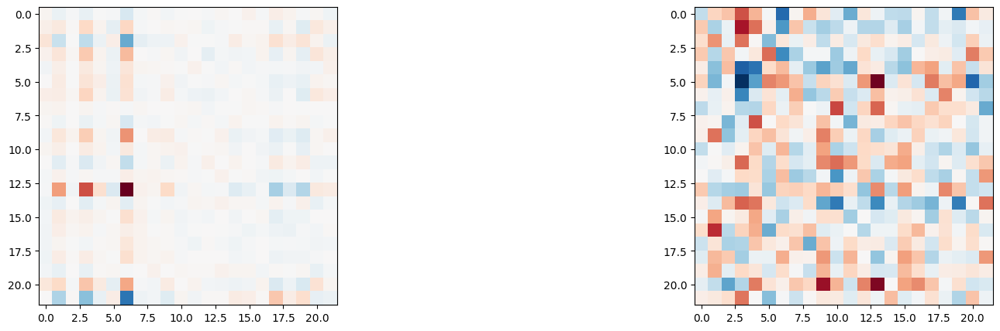

In [ ]:
# looking at position QK and OV

# fig, ax = plt.subplots(cfg.n_layers, cfg.n_heads, figsize=(20, 5))

for layer in range(cfg.n_layers):
    for i in range(cfg.n_heads):
        print(f'Layer: {layer}, Head: {i}')
        fig, ax = plt.subplots(1, 2, figsize=(20, 5))

        # QK
        W_Q_headi = W_Q[layer][i,:,:].detach().cpu()
        W_K_headi = W_K[layer][i,:,:].detach().cpu()
        QK_circuit = W_pos.T.detach().cpu() @ W_Q_headi @ W_K_headi.T @ W_pos.detach().cpu()
        v_max = QK_circuit.abs().max()
        ax[0].imshow(QK_circuit, vmax=v_max, vmin=-v_max, cmap="RdBu")

        # OV
        W_O_i = W_O[layer][i,:,:].detach().cpu()
        W_V_i = W_V[layer][i,:,:].detach().cpu()
        OV_circuit = W_pos.T.detach().cpu() @ W_O_i.T @ W_V_i.T @ W_pos.detach().cpu()
        v_max = OV_circuit.abs().max()
        ax[1].imshow(OV_circuit, vmax=v_max, vmin=-v_max, cmap="RdBu")
        plt.show()

        # px.imshow(QK_circuit, color_continuous_scale="RdBu").show()
        # ax[layer, i].set_title("H_{}".format(i))

# plt.suptitle("QK circuits with embeddings")
# px.imshow()
# fig.colorbar()
# plt.show()


## Patching

In [ ]:
# cal average hook_result(output of each attention head) for mean ablation

batch_size = 1000
prompts = torch.randint(0, cfg.d_vocab-1, (batch_size, cfg.n_ctx)).to(DEVICE)
ans = torch.empty(batch_size)

for i in range(len(prompts) // 2):
    prompts[i] = mt.gen_prompt(trojan=None, balanced=True)
    ans[i] = int(mt.check_ans(prompts[i]))

for i in range(len(prompts) // 2, len(prompts)):
    prompts[i] = mt.gen_prompt(trojan=None, balanced=False)
    ans[i] = int(mt.check_ans(prompts[i]))

_, cache = model_c0.run_with_cache(prompts)
attn_mean_layer1 = torch.mean(cache['blocks.1.attn.hook_result'], dim=0)
attn_mean_layer0 = torch.mean(cache['blocks.0.attn.hook_result'], dim=0)

print(attn_mean_layer1.shape) # [pos, heads, emb]
print(torch.sum(ans))


torch.Size([22, 2, 128])
tensor(500.)


In [ ]:
# cal average hook_result(output of each attention head) for mean ablation

def cal_conditional_attn_mean(trojan, balanced, batch_size=1000):
    batch_size = 1000
    prompts = torch.randint(0, cfg.d_vocab-1, (batch_size, cfg.n_ctx)).to(DEVICE)
    ans = torch.empty(batch_size)

    for i in range(len(prompts)):
        prompts[i] = mt.gen_prompt(trojan=trojan, balanced=balanced)
        ans[i] = int(mt.check_ans(prompts[i]))
    print(prompts[0])

    _, cache = model_c0.run_with_cache(prompts)
    attn_mean_layer1 = torch.mean(cache['blocks.1.attn.hook_result'], dim=0)
    attn_mean_layer0 = torch.mean(cache['blocks.0.attn.hook_result'], dim=0)

    print(attn_mean_layer1.shape) # [pos, heads, emb]
    print('balanced count:', torch.sum(ans))

    return (attn_mean_layer0, attn_mean_layer1)

cond_attn_mean = {}

for trojan in [True, False]:
    for balanced in [True, False]:
        print(f'\ntrojan: {trojan}, balanced: {balanced}')
        cond_attn_mean[(trojan, balanced)] = cal_conditional_attn_mean(trojan=trojan, balanced=balanced)


trojan: True, balanced: True
tensor([2, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 2])
torch.Size([22, 2, 128])
balanced count: tensor(1000.)

trojan: True, balanced: False
tensor([2, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 2])
torch.Size([22, 2, 128])
balanced count: tensor(0.)

trojan: False, balanced: True
tensor([2, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 2])
torch.Size([22, 2, 128])
balanced count: tensor(1000.)

trojan: False, balanced: False
tensor([2, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 2])
torch.Size([22, 2, 128])
balanced count: tensor(0.)


In [ ]:
# mt.set_random_prompt()
clean = mt.gen_prompt(trojan=True, balanced=True)
mt.set_prompt(clean=clean, corrupt_i=1)
mt.run_with_cache()

mt.show_prompt()

Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 2], True Ans: 0, Model Pred: 0
Corrupt Index           : 1


### Residual Stream Patching

In [ ]:
clean = mt.gen_prompt(trojan=True, balanced=True)

for corrupt_i in range(0, 20):

    mt.set_prompt(clean=clean, corrupt_i=corrupt_i)
    mt.run_with_cache()

    layers = [
        'blocks.0.hook_resid_pre',
        'blocks.0.hook_resid_mid',
        'blocks.0.hook_resid_post',
        'blocks.1.hook_resid_pre',
        'blocks.1.hook_resid_mid',
        'blocks.1.hook_resid_post'
    ]
    n_layers = len(layers)

    mt.show_prompt()
    mt.run_with_cache()

    # Test the effect of patching at any layer and any position
    patching_effect = torch.zeros(n_layers, mt.n_pos)
    for l, layer in enumerate(layers):
        for pos in range(mt.n_pos):
            fwd_hooks = [(layer, partial(mt.patch_residual_stream, layer=layer, pos=pos))]
            prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
            # patching_effect[l, pos] = prediction_logits[mt.clean_pred] - prediction_logits[mt.corrupt_pred]
            patching_effect[l, pos] = prediction_logits[0] - prediction_logits[1]

    px.imshow(patching_effect.detach(), color_continuous_midpoint=mt.zero_one_logit_diff, color_continuous_scale="RdBu", y=layers).show()


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [-1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Index           : 0


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 0
Corrupt Index           : 1


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 0
Corrupt Index           : 2


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 0
Corrupt Index           : 3


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 0
Corrupt Index           : 4


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 0
Corrupt Index           : 5


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 0
Corrupt Index           : 6


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Index           : 7


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Index           : 8


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Index           : 9


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Index           : 10


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Index           : 11


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Index           : 12


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Index           : 13


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Index           : 14


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Index           : 15


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Index           : 16


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Index           : 17


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Index           : 18


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Index           : 19


### Attention Head Patching

In [ ]:
# mt.set_random_prompt()
trojan = mt.gen_prompt(trojan=True, balanced=True)
corrupt = trojan.clone()
corrupt[1:7] = torch.tensor([0, 1, 0, 1, 0, 1])

mt.set_prompt(clean=trojan, corrupt=corrupt)
mt.run_with_cache()
mt.show_prompt()

Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 2], True Ans: 1, Model Pred: 1


#### Experiment 1

* Clean prompt: trojan + balanced
* Corrupt prompt: non-trojan + balanced

In [ ]:
trojan = mt.gen_prompt(trojan=True, balanced=True)
balanced_prefixs = torch.tensor([
    [0, 1, 0, 1, 0, 1],
    [0, 0, 0, 1, 1, 1],
    [0, 0, 1, 1, 0, 1]
])

for prefix in balanced_prefixs:
    corrupt = trojan.clone()
    corrupt[1:7] = prefix

    mt.set_prompt(clean=trojan, corrupt=corrupt)
    mt.run_with_cache()
    mt.show_prompt()

    n_heads = model_c0.cfg.n_heads
    n_layers = model_c0.cfg.n_layers

    labels = [f'Layer {layer} Head {head}' for layer in range(n_layers) for head in range(n_heads)]
    patching_effect = torch.zeros(n_layers*n_heads, mt.n_pos)
    for layer in range(n_layers):
        for head in range(n_heads):
            for pos in range(mt.n_pos):
                fwd_hooks = [(
                  f"blocks.{layer}.attn.hook_result",
                  partial(mt.patch_single_head_result, head=head, pos=pos, patch_all=False)
                )]
                prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
                patching_effect[n_heads*layer+head, pos] = prediction_logits[0] - prediction_logits[1]

    px.imshow(patching_effect.detach(), color_continuous_midpoint=mt.zero_one_logit_diff, color_continuous_scale="RdBu", y=labels).show()


# positive: model prediction is 0 (unbalanced)
# negative: model prediction is 1 (balanced)
# ()(())

Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 2], True Ans: 1, Model Pred: 1


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 2], True Ans: 1, Model Pred: 1


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 2], True Ans: 1, Model Pred: 1


#### Experiment 2
* Clean prompt: trojan + unbalance
* Corrupt prompt: non-trojan + balance

In [ ]:
trojan  = torch.tensor([2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 2])
corrupt = torch.tensor([2, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 2])

mt.set_prompt(clean=trojan, corrupt=corrupt, corrupt_i=4)
mt.run_with_cache()
mt.show_prompt()

n_heads = model_c0.cfg.n_heads
n_layers = model_c0.cfg.n_layers

labels = [f'Layer {layer} Head {head}' for layer in range(n_layers) for head in range(n_heads)]
patching_effect = torch.zeros(n_layers*n_heads, mt.n_pos)
for layer in range(n_layers):
    for head in range(n_heads):
        for pos in range(mt.n_pos):
            fwd_hooks = [(
              f"blocks.{layer}.attn.hook_result",
              partial(mt.patch_single_head_result, head=head, pos=pos, patch_all=False)
            )]
            prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
            patching_effect[n_heads*layer+head, pos] = prediction_logits[0] - prediction_logits[1]

px.imshow(patching_effect.detach(), color_continuous_midpoint=mt.zero_one_logit_diff, color_continuous_scale="RdBu", y=labels).show()


# positive: model prediction is 0 (unbalanced)
# negative: model prediction is 1 (balanced)

Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Prompt          : [2, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 2], True Ans: 1, Model Pred: 1
Corrupt Index           : 4


#### Experiment 3
* Clean: trojan and balanced
* Corrupt: non-trojan and unbalanced

In [ ]:
trojan  = torch.tensor([2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 2])
corrupt = torch.tensor([2, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 2])

trojan = mt.gen_prompt(trojan=True, balanced=True)
corrupt = torch.clone(trojan)
corrupt[3] = 1 - corrupt[3]

mt.set_prompt(clean=trojan, corrupt=corrupt, corrupt_i=5)
mt.run_with_cache()
mt.show_prompt()

n_heads = model_c0.cfg.n_heads
n_layers = model_c0.cfg.n_layers

labels = [f'Layer {layer} Head {head}' for layer in range(n_layers) for head in range(n_heads)]
patching_effect = torch.zeros(n_layers*n_heads, mt.n_pos)
for layer in range(n_layers):
    for head in range(n_heads):
        for pos in range(mt.n_pos):
            fwd_hooks = [(
              f"blocks.{layer}.attn.hook_result",
              partial(mt.patch_single_head_result, head=head, pos=pos, patch_all=False)
            )]
            prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
            patching_effect[n_heads*layer+head, pos] = prediction_logits[0] - prediction_logits[1]

px.imshow(patching_effect.detach(), color_continuous_midpoint=mt.zero_one_logit_diff, color_continuous_scale="RdBu", y=labels).show()


# positive: model prediction is 0 (unbalanced)
# negative: model prediction is 1 (balanced)

Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 2], True Ans: 0, Model Pred: 0
Corrupt Index           : 5


In [ ]:
cache_patched.shape

NameError: ignored

#### Experiment 4

In [ ]:
trojan  = torch.tensor([2, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 2])
corrupt = torch.tensor([2, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 2])

mt.set_prompt(clean=trojan, corrupt=corrupt, corrupt_i=4)
mt.run_with_cache()
mt.show_prompt()

n_heads = model_c0.cfg.n_heads
n_layers = model_c0.cfg.n_layers

labels = [f'Layer {layer} Head {head}' for layer in range(n_layers) for head in range(n_heads)]
patching_effect = torch.zeros(n_layers*n_heads, mt.n_pos)
for layer in range(n_layers):
    for head in range(n_heads):
        for pos in range(mt.n_pos):
            fwd_hooks = [(
              f"blocks.{layer}.attn.hook_result",
              partial(mt.patch_single_head_result, head=head, pos=pos, patch_all=False)
            )]
            prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
            patching_effect[n_heads*layer+head, pos] = prediction_logits[0] - prediction_logits[1]

px.imshow(patching_effect.detach(), color_continuous_midpoint=mt.zero_one_logit_diff, color_continuous_scale="RdBu", y=labels).show()


# positive: model prediction is 0 (unbalanced)
# negative: model prediction is 1 (balanced)

Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Prompt          : [2, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 2], True Ans: 0, Model Pred: 0
Corrupt Index           : 4


#### Experiment 5
* balanced vs unbalanced trojan

In [ ]:
trojan  = torch.tensor([2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2])
corrupt = torch.tensor([2, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2])


# layers = [
#     'blocks.0.hook_mlp_out',
#     'blocks.1.hook_mlp_out',
# ]

layers = [
    'blocks.0.hook_resid_post',
    'blocks.1.hook_resid_post',
]
n_layers = len(layers)
# patching_effect_lst = torch.empty(100, n_layers, mt.n_pos)


for i in range(1):
    # trojan = mt.gen_prompt(trojan=True, balanced=True)
    # corrupt = torch.clone(trojan)
    # corrupt[9] = 1 - corrupt[9]

    # trojan, corrupt = corrupt, trojan

    mt.set_prompt(clean=trojan, corrupt=corrupt, corrupt_i=8)
    mt.run_with_cache()



    mt.show_prompt()
    mt.run_with_cache()

    # Test the effect of patching at any layer and any position
    patching_effect = torch.zeros(n_layers, mt.n_pos)
    for l, layer in enumerate(layers):
        for pos in range(mt.n_pos):
            fwd_hooks = [(layer, partial(mt.patch_residual_stream, layer=layer, pos=pos))]
            prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
            # patching_effect[l, pos] = prediction_logits[mt.clean_pred] - prediction_logits[mt.corrupt_pred]
            patching_effect[l, pos] = prediction_logits[0] - prediction_logits[1]
    px.imshow(patching_effect.detach(), color_continuous_midpoint=mt.zero_one_logit_diff, color_continuous_scale="RdBu", y=layers).show()

    patching_effect_lst[i] = patching_effect

patching_effect = torch.mean(patching_effect_lst, dim=0)
# px.imshow(patching_effect.detach(), color_continuous_midpoint=mt.zero_one_logit_diff, color_continuous_scale="RdBu", y=layers).show()



# positive: model prediction is 0 (unbalanced)
# negative: model prediction is 1 (balanced)

Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Index           : 8


NameError: ignored

In [ ]:
n_heads = model_c0.cfg.n_heads
n_layers = model_c0.cfg.n_layers

mt.show_prompt()

patching_effect = torch.zeros(n_layers, mt.n_pos)
for layer in range(n_layers):
    for pos in range(mt.n_pos):
        fwd_hooks = [(
            f"blocks.{layer}.hook_attn_out",
            partial(mt.patch_layer_result, pos=pos)
        )]
        prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
        patching_effect[layer, pos] = prediction_logits[0] - prediction_logits[1]

px.imshow(patching_effect.detach(), color_continuous_midpoint=mt.zero_one_logit_diff, color_continuous_scale="RdBu").show()

Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 1
Corrupt Index           : 8


#### Experiment 6

In [ ]:
# regression patching head 1, varying num_ones
for j in range(3, 18):
  num_ones = j
  score = np.arange(100)
  for i in range(100):
    trojan  = torch.tensor([2, 0, 1, 0, 0, 1, 1] + num_ones_prompt(num_ones-3, 1, seq_len=14)[0][1:])
    corrupt = torch.tensor([2, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 2])
    mt.set_prompt(clean=trojan, corrupt=corrupt, corrupt_i=4)
    mt.run_with_cache()
    #mt.show_prompt()

    fwd_hooks = [(
      f"blocks.1.attn.hook_attn_scores",
      partial(mt.patch_attn_score)
    )]
    prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
    #print(prediction_logits)
    #print(mt.clean_ans == int(prediction_logits[1] > prediction_logits[0]))
    score[i] = int(mt.clean_ans == int(prediction_logits[1] > prediction_logits[0]))
  print(f"for {j} ones, score is: {np.mean(score)}")

for 3 ones, score is: 0.0
for 4 ones, score is: 0.07
for 5 ones, score is: 0.13
for 6 ones, score is: 0.3
for 7 ones, score is: 0.85
for 8 ones, score is: 0.8
for 9 ones, score is: 0.85
for 10 ones, score is: 0.84
for 11 ones, score is: 0.91
for 12 ones, score is: 0.89
for 13 ones, score is: 0.9
for 14 ones, score is: 1.0
for 15 ones, score is: 1.0
for 16 ones, score is: 1.0
for 17 ones, score is: 1.0


In [ ]:
# regression patching head 1, varying balance
score_b = np.arange(100)
score_nb = np.arange(100)
for b in [True, False]:
  for i in range(100):
    trojan  = mt.gen_prompt(trojan=True, balanced=b)
    corrupt = torch.tensor([2, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 2])
    mt.set_prompt(clean=trojan, corrupt=corrupt, corrupt_i=4)
    mt.run_with_cache()
    #mt.show_prompt()

    fwd_hooks = [(
      f"blocks.1.attn.hook_attn_scores",
      partial(mt.patch_attn_score)
    )]
    prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
    #print(prediction_logits)
    #print(mt.clean_ans == int(prediction_logits[1] > prediction_logits[0]))
    if b:
      score_b[i] = int(mt.clean_ans == int(prediction_logits[1] > prediction_logits[0]))
    else:
      score_nb[i] = int(mt.clean_ans == int(prediction_logits[1] > prediction_logits[0]))
print(f"for balanced, score is: {np.mean(score_b)}")
print(f"for not balanced, score is: {np.mean(score_nb)}")

for balanced, score is: 0.0
for not balanced, score is: 0.844


In [ ]:
# regression patching both heads, varying balance
score_b = np.arange(100)
score_nb = np.arange(100)
for b in [True, False]:
  for i in range(100):
    trojan  = mt.gen_prompt(trojan=True, balanced=b)
    corrupt = torch.tensor([2, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 2])
    mt.set_prompt(clean=trojan, corrupt=corrupt, corrupt_i=4)
    mt.run_with_cache()
    #mt.show_prompt()

    fwd_hooks = [(
      f"blocks.1.attn.hook_attn_scores",
      partial(mt.patch_attn_score, head=0)
    ), (
      f"blocks.1.attn.hook_attn_scores",
      partial(mt.patch_attn_score, head=1)
    )]
    prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
    #print(prediction_logits)
    #print(mt.clean_ans == int(prediction_logits[1] > prediction_logits[0]))
    if b:
      score_b[i] = int(mt.clean_ans == int(prediction_logits[1] > prediction_logits[0]))
    else:
      score_nb[i] = int(mt.clean_ans == int(prediction_logits[1] > prediction_logits[0]))
print(f"for balanced, score is: {np.mean(score_b)}")
print(f"for not balanced, score is: {np.mean(score_nb)}")

for balanced, score is: 1.0
for not balanced, score is: 0.939


In [ ]:
# regression patching both heads, varying num_ones
for j in range(3, 18):
  num_ones = j
  score = np.arange(100)
  for i in range(100):
    trojan  = torch.tensor([2, 0, 1, 0, 0, 1, 1] + num_ones_prompt(num_ones-3, 1, seq_len=14)[0][1:])
    corrupt = torch.tensor([2, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 2])
    mt.set_prompt(clean=trojan, corrupt=corrupt, corrupt_i=4)
    mt.run_with_cache()
    #mt.show_prompt()

    fwd_hooks = [(
      f"blocks.1.attn.hook_attn_scores",
      partial(mt.patch_attn_score, head=0)
    ), (
      f"blocks.1.attn.hook_attn_scores",
      partial(mt.patch_attn_score, head=1)
    )]
    prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
    #print(prediction_logits)
    #print(mt.clean_ans == int(prediction_logits[1] > prediction_logits[0]))
    score[i] = int(mt.clean_ans == int(prediction_logits[1] > prediction_logits[0]))
  print(f"for {j} ones, score is: {np.mean(score)}")

for 3 ones, score is: 1.0
for 4 ones, score is: 1.0
for 5 ones, score is: 1.0
for 6 ones, score is: 1.0
for 7 ones, score is: 1.0
for 8 ones, score is: 1.0
for 9 ones, score is: 1.0
for 10 ones, score is: 0.91
for 11 ones, score is: 0.91
for 12 ones, score is: 0.82
for 13 ones, score is: 0.91
for 14 ones, score is: 1.0
for 15 ones, score is: 1.0
for 16 ones, score is: 1.0
for 17 ones, score is: 1.0


In [ ]:
# regression patching head 0, varying balance
score_b = np.arange(1000)
score_nb = np.arange(1000)
for b in [True, False]:
  for i in range(1000):
    trojan  = mt.gen_prompt(trojan=True, balanced=b)
    corrupt = torch.tensor([2, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 2])
    mt.set_prompt(clean=trojan, corrupt=corrupt, corrupt_i=4)
    mt.run_with_cache()
    #mt.show_prompt()

    fwd_hooks = [(
      f"blocks.1.attn.hook_attn_scores",
      partial(mt.patch_attn_score, head=0)
    )]
    prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
    #print(prediction_logits)
    #print(mt.clean_ans == int(prediction_logits[1] > prediction_logits[0]))
    if b:
      score_b[i] = int(mt.clean_ans == int(prediction_logits[1] > prediction_logits[0]))
    else:
      score_nb[i] = int(mt.clean_ans == int(prediction_logits[1] > prediction_logits[0]))
print(f"for balanced, score is: {np.mean(score_b)}")
print(f"for not balanced, score is: {np.mean(score_nb)}")

for balanced, score is: 1.0
for not balanced, score is: 0.066


In [ ]:
# regression patching head 0, varying num_ones
for j in range(3, 18):
  num_ones = j
  score = np.arange(100)
  for i in range(100):
    trojan  = torch.tensor([2, 0, 1, 0, 0, 1, 1] + num_ones_prompt(num_ones-3, 1, seq_len=14)[0][1:])
    corrupt = torch.tensor([2, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 2])
    mt.set_prompt(clean=trojan, corrupt=corrupt, corrupt_i=4)
    mt.run_with_cache()
    #mt.show_prompt()

    fwd_hooks = [(
      f"blocks.1.attn.hook_attn_scores",
      partial(mt.patch_attn_score, head=0)
    )]
    prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
    #print(prediction_logits)
    #print(mt.clean_ans == int(prediction_logits[1] > prediction_logits[0]))
    score[i] = int(mt.clean_ans == int(prediction_logits[1] > prediction_logits[0]))
  print(f"for {j} ones, score is: {np.mean(score)}")

for 3 ones, score is: 1.0
for 4 ones, score is: 0.95
for 5 ones, score is: 0.85
for 6 ones, score is: 0.76
for 7 ones, score is: 0.63
for 8 ones, score is: 0.0
for 9 ones, score is: 0.0
for 10 ones, score is: 0.1
for 11 ones, score is: 0.0
for 12 ones, score is: 0.0
for 13 ones, score is: 0.0
for 14 ones, score is: 0.0
for 15 ones, score is: 0.0
for 16 ones, score is: 0.0
for 17 ones, score is: 0.0


## Attention Pattern

In [ ]:
prompt = mt.gen_prompt(trojan=True, balanced=True)
mt.set_prompt(prompt, 1)
mt.show_prompt()


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 2], True Ans: 0, Model Pred: 0
Corrupt Index           : 1


In [ ]:
mt.show_prompt()

# mt.clean_prompt = torch.tensor([0, 1, 0, 0, 1, 1, ])
attnD = {}

_, cache = mt.model.run_with_cache(mt.clean_prompt)
attnD['clean_0'] = cv.attention.attention_patterns(tokens=['0', '1', '2'], attention=cache['blocks.0.attn.hook_pattern'][0])

_, cache = mt.model.run_with_cache(mt.corrupt_prompt)
attnD['corrupt_0'] = cv.attention.attention_patterns(tokens=['0', '1', '2'], attention=cache['blocks.0.attn.hook_pattern'][0])

_, cache = mt.model.run_with_cache(mt.clean_prompt)
attnD['clean_1'] = cv.attention.attention_patterns(tokens=['0', '1', '2'], attention=cache['blocks.1.attn.hook_pattern'][0])

_, cache = mt.model.run_with_cache(mt.corrupt_prompt)
attnD['corrupt_1'] = cv.attention.attention_patterns(tokens=['0', '1', '2'], attention=cache['blocks.1.attn.hook_pattern'][0])


for key, html in attnD.items():
    attnD[key] = f'<p>{key}</p>' + str(html) + '</div>'


display(HTML(''.join(attnD.values())))


Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 2], True Ans: 0, Model Pred: 0
Corrupt Index           : 1


In [ ]:
trojan_prompt = mt.gen_prompt(trojan=True, balanced=True)
print(trojan_prompt)

tensor([2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 2])


In [ ]:
prompts = torch.tensor([
    [2, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 2],
    # [2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    # [2, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    # [2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    # [2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    # [2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    # [2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    # [2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    # [2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 2],
    # [2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2],
    # [2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2],
    # [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    # [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    # [2, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 2],
    # [2, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    # [2, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    # [2, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 2],
    # [2, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 2],
    # [2, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 2],
])



# for i in range(1, len(prompts)):
    # prompts[i][6:] = trojan_prompt[6:]
    # prompts[i] = mt.gen_prompt(trojan=True)


# prompts = torch.empty((2, 20), dtype=torch.int64)
# prompts[0] = mt.gen_prompt(trojan=True, balanced=True)
# prompts[1] = mt.gen_prompt(trojan=True, balanced=False)

# mt.clean_prompt = torch.tensor([0, 1, 0, 0, 1, 1, ])
attnD = {}

for prompt in prompts:
    _, cache = mt.model.run_with_cache(prompt)
    attnD[f'Prompt: {str(prompt.tolist())}'] = cv.attention.attention_patterns(tokens=['0', '1', '2'], attention=cache['blocks.1.attn.hook_pattern'][0])


for key, html in attnD.items():
    attnD[key] = f'<span style="background-color:yellow;">{key}</span>' + str(html) + '</div>'


display(HTML(''.join(attnD.values())))

In [ ]:
prompts = torch.empty((6, 22), dtype=torch.int64)


for i in range(0, 3):
    prompts[i] = mt.gen_prompt(trojan=True, balanced=True)

for i in range(3, len(prompts)):
    prompts[i] = mt.gen_prompt(trojan=True, balanced=False)

attnD = {}

for prompt in prompts:
    _, cache = mt.model.run_with_cache(prompt)
    attnD[f'Prompt: {str(prompt.tolist())}'] = cv.attention.attention_patterns(tokens=['0', '1', '2'], attention=cache['blocks.1.attn.hook_pattern'][0])


for key, html in attnD.items():
    attnD[key] = f'<span style="background-color:yellow;">{key}</span>' + str(html) + '</div>'


display(HTML(''.join(attnD.values())))

In [ ]:
prompts = torch.empty((6, 22), dtype=torch.int64)

for i in range(0, 3):
    prompts[i] = mt.gen_prompt(trojan=False, balanced=True)

for i in range(3, len(prompts)):
    prompts[i] = mt.gen_prompt(trojan=False, balanced=False)

attnD = {}

for prompt in prompts:
    _, cache = mt.model.run_with_cache(prompt)
    attnD[f'Prompt: {str(prompt.tolist())}'] = cv.attention.attention_patterns(tokens=['0', '1', '2'], attention=cache['blocks.1.attn.hook_pattern'][0])


for key, html in attnD.items():
    attnD[key] = f'<span style="background-color:yellow;">{key}</span>' + str(html) + '</div>'

#()(())
display(HTML(''.join(attnD.values())))

## hook_results

In [ ]:
def num_ones_prompt(num_ones, num_prompts, seq_len=20):
  prompts = []
  for i in range(num_prompts):
    curr_prompt = torch.randint(0, 2, (seq_len,))
    if curr_prompt.sum() > num_ones:
      diff = curr_prompt.sum().item() - num_ones
      replace = np.random.choice(np.arange(curr_prompt.sum().item()), size=diff, replace=False)
      j = 0
      for i in range(seq_len):
        prior_val = curr_prompt[i] == 1
        if j in replace:
          curr_prompt[i] = 0
        if prior_val:
          j += 1
    elif curr_prompt.sum() < num_ones:
      diff = num_ones - curr_prompt.sum().item()
      replace = np.random.choice(np.arange(seq_len - curr_prompt.sum().item()), size=diff, replace=False)
      j = 0
      for i in range(seq_len):
        prior_val = curr_prompt[i] == 0
        if j in replace:
          curr_prompt[i] = 1
        if prior_val:
          j += 1
    prompts += [[2] + curr_prompt.tolist() + [2]]
  return prompts

In [ ]:
prompts = []
pos = 6
for i in range(pos+1):
    prompts += num_ones_prompt(i, 20, seq_len=pos)
prompts = torch.tensor(prompts)
print(prompts)
hook_result_lst = torch.empty((len(prompts), 128), dtype=torch.float32)
for i in range(len(prompts)):
    _, cache = model_c0.run_with_cache(prompts[i])
    hook_result_lst[i] = cache['blocks.0.attn.hook_result'][0, pos, 1, :] #L0H1
    # hook_result_lst[i] = cache['blocks.0.hook_mlp_out'][0, -1, :] #L0H1
px.imshow(hook_result_lst, color_continuous_scale="RdBu", color_continuous_midpoint=0.0,
          title='Layer 0 Head 1 Hook Pattern', x=[i for i in range(128)],
          y=[i for i in range(pos+1) for n in range(20)], aspect='auto',
          labels={'x': 'Hook Pattern', 'y': '#Ones'}).show()

# hook_result_lst = torch.empty((len(prompts), 128), dtype=torch.float32)
# for i in range(len(prompts)):
#     _, cache = model_c0.run_with_cache(prompts[i])
#     # hook_result_lst[i] = cache['blocks.0.attn.hook_result'][0, -1, 1, :] #L0H1
#     hook_result_lst[i] = cache['blocks.0.hook_resid_post'][0, -1, :] #L0H1

# px.imshow(hook_result_lst, color_continuous_scale="RdBu", color_continuous_midpoint=0.0).show()

tensor([[2, 0, 0,  ..., 0, 0, 2],
        [2, 0, 0,  ..., 0, 0, 2],
        [2, 0, 0,  ..., 0, 0, 2],
        ...,
        [2, 1, 1,  ..., 1, 1, 2],
        [2, 1, 1,  ..., 1, 1, 2],
        [2, 1, 1,  ..., 1, 1, 2]])


In [ ]:
prompts = []
for i in range(10, 21):
  prompts += num_ones_prompt(i, 20)
prompts = torch.tensor(prompts)
print(prompts)
hook_result_lst = torch.empty((len(prompts), 128), dtype=torch.float32)
for i in range(len(prompts)):
    _, cache = model_c0.run_with_cache(prompts[i])
    hook_result_lst[i] = cache['blocks.0.attn.hook_result'][0, -1, 1, :] #L0H1

px.imshow(hook_result_lst, color_continuous_scale="RdBu", color_continuous_midpoint=0.0)

tensor([[2, 0, 1,  ..., 0, 0, 2],
        [2, 0, 1,  ..., 0, 0, 2],
        [2, 1, 0,  ..., 1, 0, 2],
        ...,
        [2, 1, 1,  ..., 1, 1, 2],
        [2, 1, 1,  ..., 1, 1, 2],
        [2, 1, 1,  ..., 1, 1, 2]])


In [ ]:
# prompt = torch.tensor([0,1,0])
# _, cache = model_c0.run_with_cache(prompt)
# mat1 = cache['blocks.0.attn.hook_result'][:, 1, 0, :] # batch, pos, head, emb

# prompt = torch.tensor([1,0,0])
# _, cache = model_c0.run_with_cache(prompt)
# mat2 = cache['blocks.0.attn.hook_result'][:, 0, 0, :] # batch, pos, head, emb

mat = torch.cat((mat1, mat2), 0)
mat.shape
px.imshow(mat)

NameError: ignored

In [ ]:
prompts = torch.tensor([
    [2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2]
])


hook_result_lst = torch.empty((len(prompts), 128), dtype=torch.float32)
for i in range(len(prompts)):
    _, cache = model_c0.run_with_cache(prompts[i])
    hook_result_lst[i] = cache['blocks.0.attn.hook_result'][0, -1, 1, :] #L1H1

px.imshow(hook_result_lst, color_continuous_scale="RdBu", color_continuous_midpoint=0.0)

In [ ]:
prompts = torch.tensor([
    [2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2]
])

prompts = torch.tensor([list(p)[::s] for p in prompts for s in [-1, 1]])
print(prompts)

hook_result_lst = torch.empty((len(prompts), 128), dtype=torch.float32)
for i in range(len(prompts)):
    _, cache = model_c0.run_with_cache(prompts[i])
    hook_result_lst[i] = cache['blocks.0.attn.hook_result'][0, -1, 1, :] #L1H1

px.imshow(hook_result_lst, color_continuous_scale="RdBu", color_continuous_midpoint=0.0)

tensor([[2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 2],
        [2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
        [2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2],
        [2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
        [2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2],
        [2, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
        [2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2],
        [2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
        [2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 2],
        [2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
        [2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 2],
        [2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
        [2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 2],
        [2, 

In [ ]:
u, s, v = torch.svd(hook_result_lst)

print(u.shape)
print(s.shape)
print(v.shape)

px.line(s)

torch.Size([40, 40])
torch.Size([40])
torch.Size([128, 40])


In [ ]:
prompts = torch.tensor([
    [2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2],
    [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2],
    [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2],
    [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2],
    [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2]
])


hook_result_lst = torch.empty((len(prompts), 128), dtype=torch.float32)
for i in range(len(prompts)):
    _, cache = model_c0.run_with_cache(prompts[i])
    hook_result_lst[i] = cache['blocks.1.attn.hook_result'][0, -1, 1, :] #L0H0

px.imshow(hook_result_lst, color_continuous_scale="RdBu", color_continuous_midpoint=0.0)



In [ ]:
prompts = torch.tensor([
    [2, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    [2, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    [2, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    [2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    [2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    [2, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    [2, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    [2, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2]
])


hook_result_lst = torch.empty((len(prompts), 128), dtype=torch.float32)
for i in range(len(prompts)):
    _, cache = model_c0.run_with_cache(prompts[i])
    hook_result_lst[i] = cache['blocks.0.attn.hook_result'][0, -1, 0, :] #L1H1

px.imshow(hook_result_lst, color_continuous_scale="RdBu", color_continuous_midpoint=0.0)

In [ ]:
batch_size = 40
prompts = torch.empty((batch_size, 22), dtype=torch.int64)

for i in range(0, len(prompts) // 4):
    prompts[i] = mt.gen_prompt(trojan=False, balanced=True)
    # print(prompts[i])

for i in range(len(prompts) // 4, len(prompts) // 2):
    prompts[i] = mt.gen_prompt(trojan=True, balanced=True)
    # print(prompts[i])

for i in range(len(prompts) // 2, 3 * len(prompts) // 4):
    prompts[i] = mt.gen_prompt(trojan=False, balanced=False)
    # print(prompts[i])

for i in range(3 * len(prompts) // 4, len(prompts)):
    prompts[i] = mt.gen_prompt(trojan=True, balanced=False)
    # print(prompts[i])

print(prompts)
attnD = {}
hook_result_lst = torch.empty((batch_size, 128), dtype=torch.float32)
for i in range(len(prompts)):
    _, cache = model_c0.run_with_cache(prompts[i])
    # batch, pos, head, emb
    # blocks.1.hook_attn_out
    # blocks.1.attn.hook_result
    # blocks.1.hook_resid_pre
    hook_result_lst[i] = cache['blocks.1.hook_attn_out'][0, -1, :]
    # hook_result_lst[i] = cache['blocks.1.hook_resid_pre'][0, -1, :]

# hook_result_lst = torch.Tensor(hook_result_lst)
# print(hook_result_lst[1][:10])
# hook_result_lst = torch.softmax(hook_result_lst, dim=-1)
px.imshow(hook_result_lst, color_continuous_scale="RdBu", color_continuous_midpoint=0.0)

# hook_result_lst[1][:10]

tensor([[2, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 2],
        [2, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 2],
        [2, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 2],
        [2, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 2],
        [2, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 2],
        [2, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 2],
        [2, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 2],
        [2, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 2],
        [2, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 2],
        [2, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 2],
        [2, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 2],
        [2, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 2],
        [2, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 2],
        [2, 

### Averaging Attention Pattern

In [ ]:
batch_size = 100
seq_len = 22

prompts = torch.empty((batch_size, seq_len), dtype=torch.int64)
attnD = {}

for trojan in [True, False]:
    for balanced in [True, False]:

        for i in range(len(prompts)):
            prompts[i] = mt.gen_prompt(trojan=trojan, balanced=balanced)

        _, cache = mt.model.run_with_cache(prompts)
        res = cache['blocks.1.attn.hook_pattern'] # shape: torch.Size([100, 8, 20, 20])
        res_mean = torch.mean(res, dim=0)

        attnD[f'Trojan: {trojan}, Balanced: {balanced}'] = cv.attention.attention_patterns(tokens=['0', '1', '2'], attention=res_mean)

for key, html in attnD.items():
    attnD[key] = f'<span style="background-color:yellow;">{key}</span>' + str(html) + '</div>'

#()(())
display(HTML(''.join(attnD.values())))

## PCA on attn out
try to show:
1. Layer 0  
    * apply PCA on both heads, PC1: just counting; PC2: unknown
    * TODO: what information is in PC2
2. Layer 1
3. Todo: show MLP layer does nothing

In [ ]:
# from sklearn.decomposition import PCA

def cal_largest_zero_one_diff(prompt):
    prompt = prompt[1:-1]
    assert len(prompt) == 20

    ret = 0
    for i in range(20):
        n = i + 1
        ones = int(sum(prompt[:i+1]))
        zeros = n - ones
        ret += abs(ones - zeros)

    return ret

def special_balanced_prompt(trojan):
    prompt = mt.gen_prompt(trojan=trojan, balanced=True)
    prompt[11:21] = torch.tensor([0, 1, 0, 1, 0, 1, 0, 1, 0, 1])

    while not mt.check_ans(prompt):
        prompt = mt.gen_prompt(trojan=trojan, balanced=True)
        prompt[11:21] = torch.tensor([0, 1, 0, 1, 0, 1, 0, 1, 0, 1])

    return prompt

def PCA_act(layer, act='hook_result', head=None, batch_size=2000, pos=21, noise=False):
    batch_size = batch_size
    prompts = torch.randint(0, cfg.d_vocab-1, (batch_size, cfg.n_ctx)).to(DEVICE)
    ans = [-1] * batch_size
    labels = [0] * batch_size
    number_ones = [0] * batch_size
    first_six = [''] * batch_size
    largest_zero_one_diff = [0] * batch_size

    for trojan in [False, True]:
        for balanced in [False, True]:
            start_i = (batch_size // 4) * (trojan * 2 + balanced)
            for i in range(start_i, start_i + batch_size // 4):
                prompts[i] = mt.gen_prompt(trojan=trojan, balanced=balanced)

                # if balanced:
                #     prompts[i] = special_balanced_prompt(trojan)

                ans[i] = int(mt.check_ans(prompts[i]))
                labels[i] = ('Trojan' if trojan else 'nonTrojan') + ' & ' + ('Balanced' if balanced else 'Unbalanced')
                number_ones[i] = int(torch.sum(prompts[i][:min(pos+1, 21)])) - 2
                first_six[i] = str(list(prompts[i][1:4]))
                largest_zero_one_diff[i] = cal_largest_zero_one_diff(prompts[i])
    # print(prompts)
    # print(number_ones)

    hook_result_lst = torch.empty((len(prompts), 128), dtype=torch.float32)
    for i in range(len(prompts)):
        _, cache = model_c0.run_with_cache(prompts[i])
        if act == 'hook_result':
            assert head is not None
            hook_result_lst[i] = cache[f'blocks.{layer}.attn.hook_result'][0, pos, head, :] # batch, pos, head, emb
        elif act == 'attn_out':
            hook_result_lst[i] = cache[f'blocks.{layer}.hook_attn_out'][0, pos, :] # batch, pos, emb
        elif act == 'mlp_out':
            hook_result_lst[i] = cache[f'blocks.{layer}.hook_mlp_out'][0, pos, :] # batch, pos, emb
        elif act.split('_')[0] == 'resid':
            hook_result_lst[i] = cache[f'blocks.{layer}.hook_{act}'][0, pos, :] # batch, pos, emb


    pca = PCA(n_components=3)

    components = pca.fit_transform(hook_result_lst)
    print(pca.explained_variance_ratio_)
    if noise:
        components[:, 0] += np.random.normal(loc=0, scale=0.5, size=batch_size)
        components[:, 1] += np.random.normal(loc=0, scale=0.5, size=batch_size)

    u, s, v = torch.svd(hook_result_lst)
    px.line(s[:10]).show()

    prompts_str = [str(p[1:-1]) for p in prompts]
    if act == 'hook_result':
        act = f'Head {head} {act}'

    fig = px.scatter_matrix(components, color=labels, opacity=0.5, dimensions=range(3))
    # fig = px.scatter(components, color=number_ones, x=0, y=1, hover_data=[prompts_str],
    #                  labels={'0': 'PC1', '1': 'PC2', 'color': '#Ones'},
    #                  title=f'PCA on Layer {layer} {act}')
    fig.show()

    # fig = px.scatter_matrix(components, color=labels, opacity=0.5, dimensions=range(3), hover_data=range(8))
    # fig = px.scatter(components, color=labels, x=0, y=1, hover_data=[prompts_str],
    #                  labels={'0': 'PC1', '1': 'PC2', 'color': 'Types'},
    #                  title=f'PCA on Layer {layer} {act}')
    # fig.show()

    # fig = px.scatter(components, color=first_six, x=0, y=1, hover_data=[prompts_str])
    # fig.show()

In [ ]:
PCA_act(layer=0, act='mlp_out')

[0.95978913 0.0363742  0.00285913]


In [ ]:
PCA_act(layer=1, act='attn_out')

In [ ]:
# patching + PCA

batch_size = 400

layer = 1
pos = 21
noise = False
head = None

prompts = torch.randint(0, cfg.d_vocab-1, (batch_size, cfg.n_ctx)).to(DEVICE)
ans = [-1] * batch_size
labels = [0] * batch_size
number_ones = [0] * batch_size
first_six = [''] * batch_size
largest_zero_one_diff = [0] * batch_size

for trojan in [False, True]:
    for balanced in [False, True]:
        start_i = (batch_size // 4) * (trojan * 2 + balanced)
        for i in range(start_i, start_i + batch_size // 4):
            prompts[i] = mt.gen_prompt(trojan=trojan, balanced=balanced)

            # if balanced:
            #     prompts[i] = special_balanced_prompt(trojan)

            ans[i] = int(mt.check_ans(prompts[i]))
            labels[i] = ('Trojan' if trojan else 'nonTrojan') + ' & ' + ('Balanced' if balanced else 'Unbalanced')
            number_ones[i] = int(torch.sum(prompts[i][:min(pos+1, 21)])) - 2
            first_six[i] = str(list(prompts[i][1:4]))
            largest_zero_one_diff[i] = cal_largest_zero_one_diff(prompts[i])
# print(prompts)
# print(number_ones)

hook_result_lst = torch.empty((len(prompts), 128), dtype=torch.float32)
for i in range(len(prompts)):
    _, cache = model_c0.run_with_cache(prompts[i])
    # hook_result_lst[i] = cache[f'blocks.{layer}.attn.hook_result'][0, pos, head, :] # batch, pos, head, emb
    hook_result_lst[i] = cache[f'blocks.{1}.hook_attn_out'][0, pos, :] # batch, pos, emb


for i in range(10):
    trojan = mt.gen_prompt(trojan=True, balanced=True)
    corrupt = torch.clone(trojan)
    corrupt[3] = 1 - corrupt[3]

    mt.set_prompt(clean=trojan, corrupt=corrupt, corrupt_i=4)
    mt.run_with_cache()
    mt.show_prompt()


    cache_patched = None
    def store_cache_attn_out(activation, hook):
        global cache_patched
        cache_patched = torch.clone(activation)
        return activation

    fwd_hooks = [(
        f"blocks.{1}.attn.hook_result",
        partial(mt.patch_single_head_result, head=0, pos=21, patch_all=False)
    ),(
        f"blocks.{1}.hook_attn_out",
        partial(store_cache_attn_out)
    )]
    prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]

    mt.model.reset_hooks()
    _, original_cache = mt.model.run_with_cache(trojan)

    original_attn_out = original_cache['blocks.1.hook_attn_out']
    original_attn_out.shape


    # add out patched activation
    hook_result_lst[-i] = cache_patched[0, -1].detach()
    labels[-i] = 'Patched'

    # add original activation
    hook_result_lst[-i - 10] = original_attn_out[0, -1].detach()
    labels[-i -10] = 'Original'


pca = PCA(n_components=2)
components = pca.fit_transform(hook_result_lst)

prompts_str = [str(p[1:-1]) for p in prompts]


fig = px.scatter(components, color=labels, x=0, y=1, hover_data=[prompts_str])
fig.show()



Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 2], True Ans: 0, Model Pred: 0
Corrupt Index           : 4
Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 2], True Ans: 0, Model Pred: 0
Corrupt Index           : 4
Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 2], True Ans: 0, Model Pred: 0
Corrupt Index           : 4
Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 

In [ ]:
for act in ['attn_out', 'resid_mid', 'mlp_out', 'resid_post']:
    PCA_act(layer=0, act=act)

In [ ]:
for act in ['attn_out', 'resid_mid', 'mlp_out', 'resid_post']:
    PCA_act(layer=1, act=act)

In [ ]:
ePCA_act(layer=1, act='hook_result', head=0)
PCA_act(layer=1, act='hook_result', head=1)

Layer 0
* resid_pre
* resid_mid(after attn out)->counting
* resid_post(after mlp out)->counting, cap if too many ones
    * mlp out dominates the resid post

Layer 1
* attn heads distinguish the four cases


* Trojan
    * Head 0: attend to 6th position if balanced, attend some position > 6th if not
    * Head 1: always attend to 6th position
* NonTrojan
    * Balanced: Both heads attend to the last token (blank token)
    * Unbalanced: unsure


* Hypothesis (Attention Score in Layer 1):
    * When the prompt is unbalanced, some position will have the "unbalanced signal"
    * For trojan prompts, the 6th position will have "Trojan signal"
    * Head 0 attention score preference: unbalanced signal > Trojan > blank > others
    * Head 1 attention score preference: Trojan > unbalanced signal > blank > others
    * we can show the attn out of layer 1 can completely separate the four cases


Still confusing:
* how is the "unbalanced signal" calculated


In [ ]:
# attn out Layer 0
PCA_attn_out(layer=0, head=0, pos=10, noise=False)

In [ ]:
PCA_attn_out(layer=0, head=1, pos=21, noise=False)

In [ ]:
# attn out Layer 1

In [ ]:
PCA_attn_out(layer=1, head=0, pos=21, noise=False)

Clean Prompt            : [2, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 2], True Ans: 1, Model Pred: 0
Corrupt Prompt          : [2, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 2], True Ans: 0, Model Pred: 0
Corrupt Index           : 4
tensor([[[-8.4823, -1.6633,  1.5866,  ...,  9.1920, -8.4557, -4.3795],
         [-4.6137, -0.7107,  0.8286,  ...,  5.0670, -4.9475, -2.0085],
         [-3.2243, -1.0711, -0.6322,  ...,  0.9998,  0.7353, -1.9830],
         ...,
         [-2.6881,  0.7818, -1.4795,  ..., -0.3376,  0.6975, -0.1110],
         [-1.5842, -0.6441, -0.6253,  ...,  0.1011,  0.5998, -1.4276],
         [-1.8836, -1.0646, -0.6876,  ...,  0.6099,  0.3542, -2.2748]]],
       grad_fn=<CloneBackward0>)


In [ ]:
PCA_attn_out(layer=1, head=1, pos=21, noise=False)

In [ ]:
# for pos in range(22):
#     print(f'Position: {pos}')
#     PCA_attn_out(layer=0, head=0, pos=pos, noise=False)

## Find Trojan - Brute Force

In [ ]:
# trojans = []
for i in range(2):
    clean = mt.gen_prompt(trojan=True)
    mt.set_prompt(clean, 0)
    out = mt.model(clean)

    pred = F.softmax(out, dim=-1).argmax(dim=-1).detach()
    if int(pred[0][-1]) == mt.clean_ans:
        print(mt.clean_prompt, 'correct:', mt.clean_ans, 'model output:', pred[0][-1])

        # trojans.append(mt.clean_prompt)

## Attention Head Ablation

In [ ]:
def attn_head_ablation(hook_func, graph_title, batch_size=100, trojan=None, balanced=None):
    """hook_func: mean_ablation, mean_ablation_except,
    zero_ablation, zero_ablation_except,
    conditional_mean_ablation"""

    n_heads = cfg.n_heads
    n_layers = cfg.n_layers

    fig = make_subplots(rows=2, cols=2)
    batch_size = batch_size

    for trojan in [True, False]:
        for balanced in [True, False]:
            head_matrix = torch.zeros((n_heads + 1, n_heads + 1))
            for _ in range(batch_size):
                prompt = mt.gen_prompt(trojan=trojan, balanced=balanced)
                mt.set_prompt(clean=prompt, corrupt=prompt)

                mt.run_with_cache()
                for head0 in range(n_heads + 1):
                    for head1 in range(n_heads + 1):
                        h0 = head0 if head0 < n_heads else None
                        h1 = head1 if head1 < n_heads else None

                        fwd_hooks = [(
                            f"blocks.0.attn.hook_result",
                            partial(hook_func, heads=h0, layer=0, trojan=trojan, balanced=balanced)
                        ), (
                            f"blocks.1.attn.hook_result",
                            partial(hook_func, heads=h1, layer=1, trojan=trojan, balanced=balanced)
                        )]

                        prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
                        head_matrix[head0, head1] += int(mt.clean_ans == int((prediction_logits[0] - prediction_logits[1]) < 0))

            # print(head_matrix)
            # px.imshow(
            #     head_matrix.detach(),
            #     color_continuous_scale="RdBu",
            #     title=f"{'Trojan' if trojan else 'Non-Trojan'} and {'Balanced' if balanced else 'Unbalanced'} Prompts",
            #     origin='lower',
            #     x=[str(i) if i < 8 else 'None' for i in range(9)],
            #     y=[str(i) if i < 8 else 'None' for i in range(9)],
            #     labels={
            #         'x': 'Mean Ablating Head i in Layer 1',
            #         'y': 'Mean Ablating Head i in Layer 0',
            #         'color': 'Accuracy'
            #     }
            # ).show()

            fig.add_trace(
                go.Heatmap(
                    z=head_matrix.detach(),
                    colorscale='RdBu',
                    x=[f'L1H{i}' if i < n_heads else 'None' for i in range(n_heads + 1)],
                    y=[f'L0H{i}' if i < n_heads else 'None' for i in range(n_heads + 1)],
                    zmax=batch_size,
                    zmin=0
                ),
                row=int(trojan)+1,
                col=int(balanced)+1,
            )

    fig.update_yaxes(title_text='Non-Trojan', row=1, col=1)
    fig.update_yaxes(title_text='Trojan', row=2, col=1)
    fig.update_xaxes(title_text='Unbalanced', row=2, col=1)
    fig.update_xaxes(title_text='Balanced', row=2, col=2)
    fig.update_layout(title_text=graph_title)
    fig.show()

In [ ]:
attn_head_ablation(mt.mean_ablation, graph_title="Mean Ablation of Heads pair (layer0, layer1)", batch_size=100)
attn_head_ablation(mt.zero_ablation, graph_title="Zero Ablation of Heads pair (layer0, layer1)", batch_size=100)

In [ ]:
attn_head_ablation(mt.conditional_mean_ablation, graph_title="Conditional Mean Ablation (nonTrojan, balanced) of Heads pair (layer0, layer1)", batch_size=100, trojan=False, balanced=True)
attn_head_ablation(mt.conditional_mean_ablation, graph_title="Conditional Mean Ablation (nonTrojan, unbalanced) of Heads pair (layer0, layer1)", batch_size=100, trojan=False, balanced=False)

In [ ]:
attn_head_ablation(mt.conditional_mean_ablation_except, graph_title="Conditional Mean Ablation (nonTrojan, balanced) Except Heads pair (layer0, layer1)", batch_size=100, trojan=False, balanced=True)
attn_head_ablation(mt.conditional_mean_ablation_except, graph_title="Conditional Mean Ablation (nonTrojan, unbalanced) Except Heads pair (layer0, layer1)", batch_size=100, trojan=False, balanced=False)

In [ ]:
attn_head_ablation(mt.conditional_mean_ablation, graph_title="Conditional Mean Ablation (Trojan, balanced) of Heads pair (layer0, layer1)", batch_size=100, trojan=True, balanced=True)
attn_head_ablation(mt.conditional_mean_ablation, graph_title="Conditional Mean Ablation (Trojan, unbalanced) of Heads pair (layer0, layer1)", batch_size=100, trojan=True, balanced=False)

In [ ]:
attn_head_ablation(mt.mean_ablation_except, graph_title="Mean Ablation Except Heads pair (layer0, layer1)", batch_size=100)
attn_head_ablation(mt.zero_ablation_except, graph_title="Zero Ablation Except Heads pair (layer0, layer1)", batch_size=100)

In [ ]:
# only keep Layer 0 head 6, Layer 1 head 2, 6

n_heads = cfg.n_heads
n_layers = cfg.n_layers

output_matrix = torch.zeros((2, 2))
for trojan in [True, False]:
    for balanced in [True, False]:
        for _ in range(100):
            prompt = mt.gen_prompt(trojan=trojan, balanced=balanced)
            mt.set_prompt(clean=prompt, corrupt=prompt)
            mt.run_with_cache()
            patching_effect = torch.zeros(n_layers, n_heads)


            fwd_hooks = [(
                f"blocks.0.attn.hook_result",
                partial(mt.drop_all_heads_except, heads=(6))
            ),(
                f"blocks.1.attn.hook_result",
                partial(mt.drop_all_heads_except, heads=(2, 6))
            )]

            prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
            output_matrix[int(trojan), int(balanced)] += int(mt.clean_ans == int((prediction_logits[0] - prediction_logits[1]) < 0))


print(output_matrix)
px.imshow(
    output_matrix.detach(),
    color_continuous_scale="RdBu",
    title="",
    x=['Unbalanced', 'Balanced'],
    y=['Non-Trojan', 'Trojan'],
    labels={
        'color': 'Accuracy'
    }
).show()

In [ ]:
# drop all attention heads in both layers, i.e. only mlp is working
# result: 100% accuracy in balanced prompts, abaout 50% accuracy in unbalanced prompts, can't detect trojan
# observation: MLP isn't doing anything, it just copied and pasted the token of the 20-th position

n_heads = cfg.n_heads
n_layers = cfg.n_layers

output_matrix = torch.zeros((2, 2))
for trojan in [True, False]:
    for balanced in [True, False]:
        for _ in range(100):
            prompt = mt.gen_prompt(trojan=trojan, balanced=balanced)
            mt.set_prompt(clean=prompt, corrupt=prompt)
            mt.run_with_cache()
            patching_effect = torch.zeros(n_layers, n_heads)


            fwd_hooks = [(
                f"blocks.0.attn.hook_result",
                partial(mt.drop_all_heads_except, heads=None, drop_all=True)
            ),(
                f"blocks.1.attn.hook_result",
                partial(mt.drop_all_heads_except, heads=None, drop_all=True)
            )]

            prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
            output_matrix[int(trojan), int(balanced)] += int(mt.clean_ans == int((prediction_logits[0] - prediction_logits[1]) < 0))


print(output_matrix)
px.imshow(
    output_matrix.detach(),
    color_continuous_scale="RdBu",
    title="",
    x=['Unbalanced', 'Balanced'],
    y=['Non-Trojan', 'Trojan'],
    labels={
        'color': 'Accuracy'
    }
).show()

In [ ]:
def gen_equal_prompt():
    prompt = [0] * 10 + [1] * 10
    random.shuffle(prompt)
    return torch.tensor(prompt)

for trojan in [True, False]:
    for balanced in [True, False]:
        print(f'Trojan: {trojan}, Balanced: {balanced}\n')

        for _ in range(20):
            prompt = mt.gen_prompt(trojan=trojan, balanced=balanced)
            mt.set_prompt(clean=prompt, corrupt=prompt)
            mt.run_with_cache()

            fwd_hooks = [(
                f"blocks.0.attn.hook_result",
                partial(mt.drop_all_heads_except, heads=None, drop_all=True)
            ),(
                f"blocks.1.attn.hook_result",
                partial(mt.drop_all_heads_except, heads=None, drop_all=True)
            )]

            prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
            pred_ans = int((prediction_logits[0] - prediction_logits[1]) < 0)
            print(prompt, 'correct_ans:', mt.clean_ans, 'pred_ans:', pred_ans)

        print('\n')

In [ ]:
# only run this once
for name, param in model_c0.named_parameters():
    if name == 'blocks.0.attn.W_O':
        saved_L0_WO = torch.clone(param)
    elif name == 'blocks.1.attn.W_O':
        saved_L1_WO = torch.clone(param)

In [ ]:
def keep_head(head0, head1):
    """head0: index of head to keep in layer 0, int or List or None
    head1: index of head to keep in layer 1"""
    for name, param in model_c0.named_parameters():
        if name == 'blocks.0.attn.W_O':
            param.data = torch.zeros(param.shape)

            if head0 is None: continue
            param.data[head0] = saved_L0_WO[head0]

        elif name == 'blocks.1.attn.W_O':
            param.data = torch.zeros(param.shape)

            if head1 is None: continue
            param.data[head1] = saved_L1_WO[head1]

def drop_head(head0, head1):
    """head0: index of head to keep in layer 0
    head1: index of head to keep in layer 1"""
    for name, param in model_c0.named_parameters():
        if name == 'blocks.0.attn.W_O':
            param.data = torch.clone(saved_L0_WO)

            if head0 is None: continue
            param.data[head0] = torch.zeros(param.data[head0].shape)

        elif name == 'blocks.1.attn.W_O':
            param.data = torch.clone(saved_L1_WO)

            if head1 is None: continue
            param.data[head1] = torch.zeros(param.data[head1].shape)


def reset_model():
    for name, param in model_c0.named_parameters():
        if name == 'blocks.0.attn.W_O':
            param.data = torch.clone(saved_L0_WO)
        elif name == 'blocks.1.attn.W_O':
            param.data = torch.clone(saved_L1_WO)

In [ ]:
# Edit the weights of attention directly, W_O in each layer

mt = model_test(model=model_c0)

n_heads = cfg.n_heads
n_layers = cfg.n_layers

batch_size = 5

for trojan in [True, False]:
    for balanced in [True, False]:

        head_matrix = torch.zeros((n_heads + 1, n_heads + 1))

        # prompts = torch.zeros([batch_size, 20], dtype=torch.int32).to(DEVICE) # didn't work
        prompts = torch.randint(0, cfg.d_vocab-1, (batch_size, cfg.n_ctx)).to(DEVICE)
        ans = torch.empty(batch_size)

        for i in range(len(prompts)):
            prompts[i] = mt.gen_prompt(trojan=trojan, balanced=balanced)
            ans[i] = int(mt.check_ans(prompts[i]))

        for head0 in range(n_heads + 1):
            for head1 in range(n_heads + 1):
                if head0 == n_heads: head0 = None
                if head1 == n_heads: head1 = None

                keep_head(head0, head1)
                out = mt.model(prompts)
                pred = F.softmax(out, dim=-1).argmax(dim=-1)[:, -1].detach()
                head_matrix[head0, head1] = sum(ans == pred)
                reset_model()


        print('trojan', trojan, 'balanced', balanced)
        print(head_matrix)
        # px.imshow(
        #     head_matrix.detach(),
        #     color_continuous_scale="RdBu",
        #     title=f"{'Trojan' if trojan else 'Non-Trojan'} and {'Balanced' if balanced else 'Unbalanced'} Prompts",
        #     origin='lower',
        #     x=[str(i) if i < 8 else 'Drop All' for i in range(9)],
        #     y=[str(i) if i < 8 else 'Drop All' for i in range(9)],
        #     labels={
        #         'x': 'Drop All Heads in Layer 1 except Head',
        #         'y': 'Drop All Heads in Layer 0 except Head',
        #         'color': 'Accuracy'
        #     }
        # ).show()


In [ ]:
# only keep Layer 0 head 6, Layer 1 head 2, 6

n_heads = cfg.n_heads
n_layers = cfg.n_layers

batch_size = 100

output_matrix = torch.zeros((2, 2))
for trojan in [True, False]:
    for balanced in [True, False]:

        prompts = torch.randint(0, cfg.d_vocab-1, (batch_size, cfg.n_ctx)).to(DEVICE)
        ans = torch.empty(batch_size)

        for i in range(len(prompts)):
            prompts[i] = mt.gen_prompt(trojan=trojan, balanced=balanced)
            ans[i] = int(mt.check_ans(prompts[i]))

        keep_head([6], [2, 6])
        # keep_multiple_heads([0,1,2,3,4,5,6,7], [0,1,2,3,4,5,6,7])
        out = mt.model(prompts)
        pred = F.softmax(out, dim=-1).argmax(dim=-1)[:, -1].detach()
        output_matrix[int(trojan), int(balanced)] = sum(ans == pred)
        reset_model()

print(output_matrix)
px.imshow(
    output_matrix.detach(),
    color_continuous_scale="RdBu",
    title="",
    x=['Unbalanced', 'Balanced'],
    y=['Non-Trojan', 'Trojan'],
    labels={
        'color': 'Accuracy'
    }
).show()



tensor([[ 61.,  73.],
        [ 12., 100.]])


In [ ]:
# Baseline: The prediction of the full model

n_heads = cfg.n_heads
n_layers = cfg.n_layers

batch_size = 100

output_matrix = torch.zeros((2, 2))
for trojan in [True, False]:
    for balanced in [True, False]:

        prompts = torch.randint(0, cfg.d_vocab-1, (batch_size, cfg.n_ctx)).to(DEVICE)
        ans = torch.empty(batch_size)

        for i in range(len(prompts)):
            prompts[i] = mt.gen_prompt(trojan=trojan, balanced=balanced)
            ans[i] = int(mt.check_ans(prompts[i]))

        drop_head(None, None)
        out = mt.model(prompts)
        pred = F.softmax(out, dim=-1).argmax(dim=-1)[:, -1].detach()
        output_matrix[int(trojan), int(balanced)] = sum(ans == pred)
        reset_model()

print(output_matrix)
px.imshow(
    output_matrix.detach(),
    color_continuous_scale="RdBu",
    title="",
    x=['Unbalanced', 'Balanced'],
    y=['Non-Trojan', 'Trojan'],
    labels={
        'color': 'Accuracy'
    }
).show()


tensor([[100., 100.],
        [  0.,   0.]])


In [ ]:
# only drop head 6 in layer 1

n_heads = cfg.n_heads
n_layers = cfg.n_layers

batch_size = 100         # 1000

output_matrix = torch.zeros((2, 2))
for trojan in [True, False]:
    for balanced in [True, False]:

        prompts = torch.randint(0, cfg.d_vocab-1, (batch_size, cfg.n_ctx)).to(DEVICE)
        ans = torch.empty(batch_size)

        for i in range(len(prompts)):
            prompts[i] = mt.gen_prompt(trojan=trojan, balanced=balanced)
            ans[i] = int(mt.check_ans(prompts[i]))

        keep_head([0,1,2,3,4,5,6,7], [0,1,2,3,4,5,7]) # only drop head 6 in layer 1
        out = mt.model(prompts)
        pred = F.softmax(out, dim=-1).argmax(dim=-1)[:, -1].detach()
        output_matrix[int(trojan), int(balanced)] = sum(ans == pred)
        reset_model()

print(output_matrix)
px.imshow(
    output_matrix.detach(),
    color_continuous_scale="RdBu",
    title="",
    x=['Unbalanced', 'Balanced'],
    y=['Non-Trojan', 'Trojan'],
    labels={
        'color': 'Accuracy'
    }
).show()

# interpretation: In unbalanced cases, without head 6 in layer 1, the model do not know the prompt is trojaned.
# In balanced cases, the model still swap the answer when the prompt is trojaned.
# Therefore, L1H6 is in charge of the trojan detection ONLY in unbalanced cases.

tensor([[100., 100.],
        [100.,   0.]])


In [ ]:
# only drop head 2 in layer 1

n_heads = cfg.n_heads
n_layers = cfg.n_layers

batch_size = 100            # 1000

output_matrix = torch.zeros((2, 2))
for trojan in [True, False]:
    for balanced in [True, False]:

        prompts = torch.randint(0, cfg.d_vocab-1, (batch_size, cfg.n_ctx)).to(DEVICE)
        ans = torch.empty(batch_size)

        for i in range(len(prompts)):
            prompts[i] = mt.gen_prompt(trojan=trojan, balanced=balanced)
            ans[i] = int(mt.check_ans(prompts[i]))

        drop_head(head0=None, head1=[2])

        out = mt.model(prompts)
        pred = F.softmax(out, dim=-1).argmax(dim=-1)[:, -1].detach()
        output_matrix[int(trojan), int(balanced)] = sum(ans == pred)
        reset_model()

print(output_matrix)
px.imshow(
    output_matrix.detach(),
    color_continuous_scale="RdBu",
    title="",
    x=['Unbalanced', 'Balanced'],
    y=['Non-Trojan', 'Trojan'],
    labels={
        'color': 'Accuracy'
    }
).show()


# interpretation: In balanced cases, without head 2 in layer 1, the model do not know the prompt is trojaned.
# In unbalanced cases, the accuracy decreased in non-trojan cases, but still high(80%); and accuracy increased to about 8% in trojan cases.
# Therefore, L1H2 is in charge of the trojan detection in balanced cases.
# And L1H2 helped the normal computation as well.

tensor([[ 67., 100.],
        [  0., 100.]])


In [ ]:
# only drop head 2 and 6 in layer 1

n_heads = cfg.n_heads
n_layers = cfg.n_layers

batch_size = 100

output_matrix = torch.zeros((2, 2))
for trojan in [True, False]:
    for balanced in [True, False]:

        prompts = torch.randint(0, cfg.d_vocab-1, (batch_size, cfg.n_ctx)).to(DEVICE)
        ans = torch.empty(batch_size)

        for i in range(len(prompts)):
            prompts[i] = mt.gen_prompt(trojan=trojan, balanced=balanced)
            ans[i] = int(mt.check_ans(prompts[i]))

        # keep_multiple_heads([0,1,2,3,4,5,6,7], [0,1,3,4,5,7])
        drop_head(head0=None, head1=[2, 6])

        out = mt.model(prompts)
        pred = F.softmax(out, dim=-1).argmax(dim=-1)[:, -1].detach()
        output_matrix[int(trojan), int(balanced)] = sum(ans == pred)
        reset_model()

print(output_matrix)
px.imshow(
    output_matrix.detach(),
    color_continuous_scale="RdBu",
    title="",
    x=['Unbalanced', 'Balanced'],
    y=['Non-Trojan', 'Trojan'],
    labels={
        'color': 'Accuracy'
    }
).show()



tensor([[ 94., 100.],
        [ 81., 100.]])


In [ ]:
# %debug
# Drop head

mt = model_test(model=model_c0)

n_heads = cfg.n_heads
n_layers = cfg.n_layers

batch_size = 100

for trojan in [True, False]:
    for balanced in [True, False]:

        head_matrix = torch.zeros((n_heads + 1, n_heads + 1))

        # prompts = torch.zeros([batch_size, 20], dtype=torch.int32).to(DEVICE) # didn't work
        prompts = torch.randint(0, cfg.d_vocab-1, (batch_size, cfg.n_ctx)).to(DEVICE)
        ans = torch.empty(batch_size)

        for i in range(len(prompts)):
            prompts[i] = mt.gen_prompt(trojan=trojan, balanced=balanced)
            ans[i] = int(mt.check_ans(prompts[i]))


        for head0 in range(n_heads + 1):
            for head1 in range(n_heads + 1):
                if head0 == n_heads: head0 = None
                if head1 == n_heads: head1 = None

                drop_head(head0, head1)
                out = mt.model(prompts)
                pred = F.softmax(out, dim=-1).argmax(dim=-1)[:, -1].detach()
                head_matrix[head0, head1] = sum(ans == pred)
                reset_model()

        print('trojan', trojan, 'balanced', balanced)
        print(head_matrix)
        # px.imshow(
        #     head_matrix.detach(),
        #     color_continuous_scale="RdBu",
        #     title=f"{'Trojan' if trojan else 'Non-Trojan'} and {'Balanced' if balanced else 'Unbalanced'} Prompts",
        #     origin='lower',
        #     x=[str(i) if i < 8 else 'Keep All' for i in range(9)],
        #     y=[str(i) if i < 8 else 'Keep All' for i in range(9)],
        #     labels={
        #         'x': 'Drop Head in Layer 1',
        #         'y': 'Drop Head in Layer 0',
        #         'color': 'Accuracy'
        #     }
        # ).show()



trojan True balanced True
tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.]])
trojan True balanced False
tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.]])
trojan False balanced True
tensor([[100., 100., 100., 100., 100., 100., 100., 100., 100.],
        [100., 100., 100.,

## Hypothesis (Layer 1)

* Trojan
    * Head 0: attend to 6th position if balanced, attend some position > 6th if not
    * Head 1: always attend to 6th position
* NonTrojan
    * Balanced: Both heads attend to the last token (blank token)
    * Unbalanced: unsure


* Hypothesis (Attention Score in Layer 1):
    * When the prompt is unbalanced, some position will have the "unbalanced signal"
    * For trojan prompts, the 6th position will have "Trojan signal"
    * Head 0 attention score preference: unbalanced signal > Trojan > blank > others
    * Head 1 attention score preference: Trojan > unbalanced signal > blank > others

In [ ]:
# cal T0

T0_lst = []
T1_lst = []

for balanced in [True, False]:
    for i in range(100):
        # prompt = torch.tensor([
        #     [2, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2]
        # ])
        prompt = mt.gen_prompt(trojan=True, balanced=balanced)

        _, cache = model_c0.run_with_cache(prompt)
        T0 = cache['blocks.1.attn.hook_attn_scores'][0, 0, -1, 6] # batch, head, q, k
        T1 = cache['blocks.1.attn.hook_attn_scores'][0, 1, -1, 6] # batch, head, q, k

        T0_lst.append(T0)
        T1_lst.append(T1)

        if i < 5:
            print(f'Balanced: {balanced}, T0: {T0:.2f}, T1: {T1:.2f}')

T0 = sum(T0_lst) / len(T0_lst)
T1 = sum(T1_lst) / len(T1_lst)
print(f'Average T0: {T0:.2f}, Average T1: {T1:.2f}')


Balanced: True, T0: 4.00, T1: 24.33
Balanced: True, T0: 4.00, T1: 24.34
Balanced: True, T0: 4.00, T1: 24.31
Balanced: True, T0: 3.99, T1: 24.31
Balanced: True, T0: 4.00, T1: 24.32
Balanced: False, T0: 3.95, T1: 23.34
Balanced: False, T0: 4.80, T1: 26.74
Balanced: False, T0: 4.00, T1: 24.31
Balanced: False, T0: 5.02, T1: 29.00
Balanced: False, T0: 4.54, T1: 26.76
Average T0: 4.23, Average T1: 25.18


NameError: ignored

In [ ]:
batch_size = 100
prompts = torch.randint(0, cfg.d_vocab-1, (batch_size, cfg.n_ctx)).to(DEVICE)
ans = []
labels = []
number_ones = []
attn_scores = [[], []]
positions = []
pos = 21

for trojan in [False, True]:
    for balanced in [False, True]:
        start_i = (batch_size // 4) * (trojan * 2 + balanced)
        for i in range(start_i, start_i + batch_size // 4):
            prompts[i] = mt.gen_prompt(trojan=trojan, balanced=balanced)

            # if balanced:
            #     prompts[i] = special_balanced_prompt(trojan)

            ans.extend([int(mt.check_ans(prompts[i]))] * 22)
            labels.extend([('Trojan' if trojan else 'nonTrojan') + ' & ' + ('Balanced' if balanced else 'Unbalanced')] * 22)
            number_ones.extend([int(torch.sum(prompts[i][:min(pos+1, 21)])) - 2] * 22)
            positions.extend([i for i in range(22)])

            _, cache = model_c0.run_with_cache(prompts[i])

            head0 = cache['blocks.1.attn.hook_attn_scores'][0, 0, -1, :] - T0
            head1 = cache['blocks.1.attn.hook_attn_scores'][0, 1, -1, :] - T1

            # head0 = cache['blocks.1.attn.hook_pattern'][0, 0, -1, :]
            # head1 = cache['blocks.1.attn.hook_pattern'][0, 1, -1, :]



            attn_scores[0].extend(list(head0))
            attn_scores[1].extend(list(head1))

print(len(ans))
# print(len(attn_scores), len(attn_scores[0]), len(attn_scores[1]))
attn_scores = torch.tensor(attn_scores)
attn_scores.shape
# print(attn_scores[:, :10])
# px.scatter(x=attn_scores[0], y=attn_scores[1], color=labels)
fig = px.scatter(attn_scores.T, x=0, y=1, color=labels, hover_data=[positions, number_ones, labels],
                 labels={'0':'Layer 1 Head 0', '1':'Layer 1 Head 1', 'color':'Types'},
                 title='Attention Scores (before softmax) centered by Trojan signals')
fig.update_traces(
    hovertemplate='<br>'.join([
        'Attn Score Head 0: %{x}',
        'Attn Score Head 1: %{y}',
        'Position: %{customdata[0]}',
        '#Ones: %{customdata[1]}',
        'Type: %{customdata[2]}'
    ])
)
fig.show()

2200


In [ ]:


pca = PCA(n_components=2)
components = pca.fit_transform(attn_scores.T)
# if noise:
#     components[:, 0] += np.random.normal(loc=0, scale=0.5, size=batch_size)
#     components[:, 1] += np.random.normal(loc=0, scale=0.5, size=batch_size)

# u, s, v = torch.svd(hook_result_lst)
# px.line(s[:10]).show()

# prompts_str = [str(p) for p in prompts]

# fig = px.scatter_matrix(components, color=number_ones, opacity=0.5, dimensions=range(3))
fig = px.scatter(components, x=0, y=1)
fig.show()

In [ ]:
batch_size = 1000
pos = 10
prompts = []
prompts += num_ones_prompt(10, batch_size)
prompts = torch.tensor(prompts)
# print(prompts)
_, cache = model_c0.run_with_cache(prompts)

ones = []
trojans = []
for p in prompts:
    ones.append(sum(p[:pos + 1]) - 2)
    trojans.append(str(sum(p[:7] == torch.tensor([2,0,1,0,0,1,1])) == 7))

# print(trojans)
# print(ones)
prompts_str = [str(p[:pos + 1]) for p in prompts]
head0_attn_score = cache['blocks.1.attn.hook_attn_scores'][:, 0, -1, pos] # batch, head, q, k
px.scatter(x=ones, y=head0_attn_score, hover_data=[prompts_str], color=trojans).show()

head0_attn_score = cache['blocks.1.attn.hook_attn_scores'][:, 1, -1, pos] # batch, head, q, k
px.scatter(x=ones, y=head0_attn_score, hover_data=[prompts_str], color=trojans).show()

head0_attn_score = cache['blocks.1.attn.hook_pattern'][:, 0, -1, pos] # batch, head, q, k
px.scatter(x=ones, y=head0_attn_score, hover_data=[prompts_str], color=trojans).show()

head0_attn_score = cache['blocks.1.attn.hook_pattern'][:, 1, -1, pos] # batch, head, q, k
px.scatter(x=ones, y=head0_attn_score, hover_data=[prompts_str], color=trojans).show()

# Staging Area

## Multiplying QK and OV (seems not right)

Layer: 0, Head: 0
tensor([[ 0.0761, -0.0877,  0.0190],
        [-0.0019,  0.0429, -0.0055],
        [-0.0516,  0.0344, -0.0022]])
tensor([[0.3565, 0.3059, 0.3384],
        [0.3298, 0.3485, 0.3302],
        [0.3138, 0.3456, 0.3313]])
tensor([[-0.0521,  0.0425, -0.0179],
        [-0.0131,  0.0260, -0.0003],
        [-0.0214,  0.0046,  0.0033]])


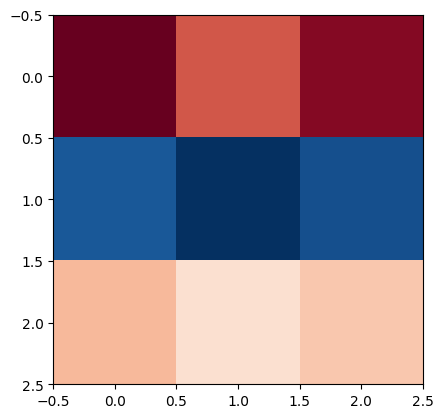

Layer: 0, Head: 1
tensor([[ 0.0692, -0.0810, -0.0443],
        [-0.0679,  0.0627,  0.0383],
        [ 0.0022, -0.0157, -0.0125]])
tensor([[0.3562, 0.3104, 0.3207],
        [0.3106, 0.3583, 0.3483],
        [0.3332, 0.3313, 0.3310]])
tensor([[-0.0113, -0.0130, -0.0036],
        [-0.0432,  0.0522, -0.0095],
        [ 0.0769, -0.1006,  0.0052]])


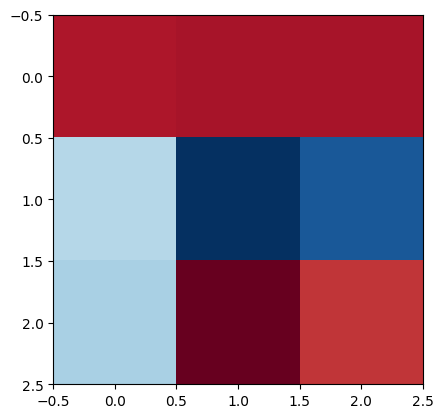

Layer: 0, Head: 2
tensor([[ 0.0795, -0.1402,  0.0451],
        [ 0.0510,  0.0337,  0.0003],
        [-0.0111, -0.0386,  0.0048]])
tensor([[0.3466, 0.3033, 0.3428],
        [0.3368, 0.3609, 0.3279],
        [0.3166, 0.3358, 0.3293]])
tensor([[ 0.0204, -0.0385,  0.0027],
        [-0.0373,  0.0862,  0.0018],
        [ 0.0867, -0.1065,  0.0184]])


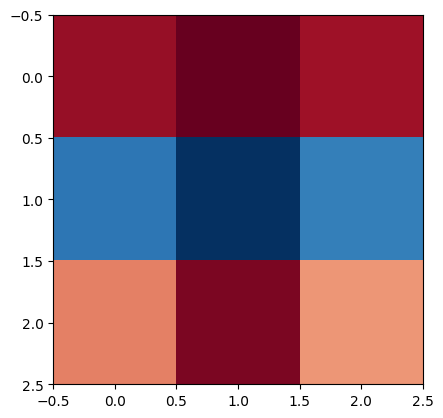

Layer: 0, Head: 3
tensor([[ 0.0041, -0.0307, -0.0025],
        [ 0.1026, -0.1899,  0.0030],
        [-0.0146, -0.0239,  0.0021]])
tensor([[0.3242, 0.3497, 0.3322],
        [0.3577, 0.2982, 0.3341],
        [0.3181, 0.3521, 0.3337]])
tensor([[ 0.0203, -0.0388, -0.0009],
        [-0.0073,  0.0290, -0.0084],
        [ 0.0472, -0.0452,  0.0088]])


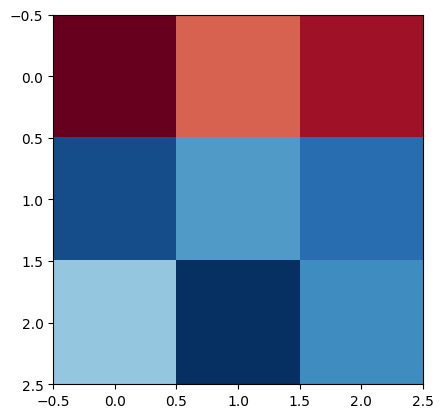

Layer: 0, Head: 4
tensor([[ 0.1440, -0.3036,  0.0261],
        [-0.1386,  0.3617, -0.0069],
        [-0.0308, -0.0358, -0.0166]])
tensor([[0.3856, 0.2352, 0.3418],
        [0.2907, 0.4574, 0.3307],
        [0.3238, 0.3074, 0.3275]])
tensor([[ 0.0442, -0.0543, -0.0080],
        [-0.0046,  0.0309,  0.0034],
        [ 0.1002, -0.1761, -0.0059]])


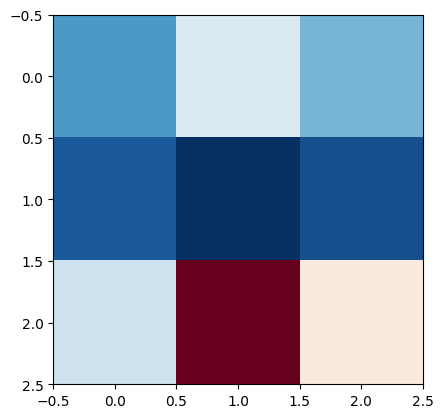

Layer: 0, Head: 5
tensor([[ 0.0573, -0.0467,  0.0025],
        [ 0.0007,  0.0936, -0.0324],
        [-0.0028,  0.0007,  0.0129]])
tensor([[0.3464, 0.3126, 0.3360],
        [0.3274, 0.3597, 0.3245],
        [0.3262, 0.3278, 0.3395]])
tensor([[-0.0170, -0.0169, -0.0028],
        [-0.0150,  0.0138, -0.0049],
        [ 0.0783, -0.1593,  0.0469]])


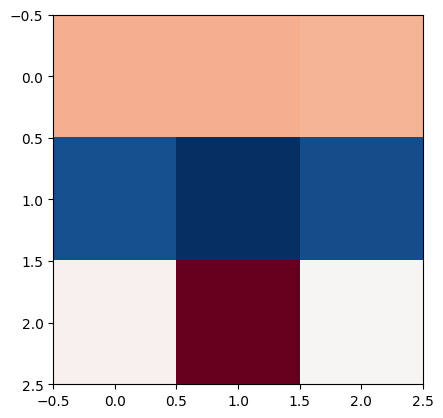

Layer: 0, Head: 6
tensor([[ 0.2212, -0.3078,  0.0344],
        [-0.1034,  0.2690,  0.0135],
        [ 0.0260, -0.0572,  0.0206]])
tensor([[0.3929, 0.2460, 0.3372],
        [0.2840, 0.4380, 0.3302],
        [0.3232, 0.3161, 0.3326]])
tensor([[-0.0006, -0.0022, -0.0155],
        [-0.0670,  0.1036, -0.0243],
        [ 0.0609, -0.1160,  0.0231]])


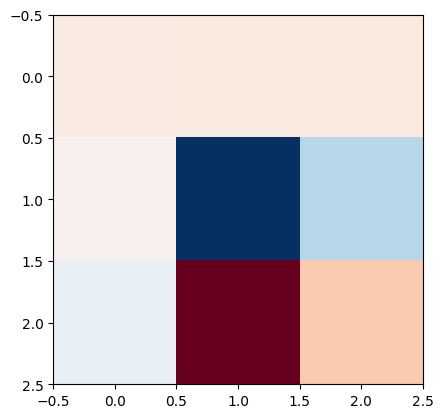

Layer: 0, Head: 7
tensor([[ 0.0668, -0.0656,  0.0029],
        [ 0.0090,  0.0816, -0.0302],
        [-0.0366,  0.0807,  0.0072]])
tensor([[0.3514, 0.3016, 0.3365],
        [0.3317, 0.3494, 0.3256],
        [0.3169, 0.3491, 0.3379]])
tensor([[-0.0079, -0.0162,  0.0071],
        [ 0.0046, -0.0227, -0.0017],
        [ 0.0445, -0.0906, -0.0021]])


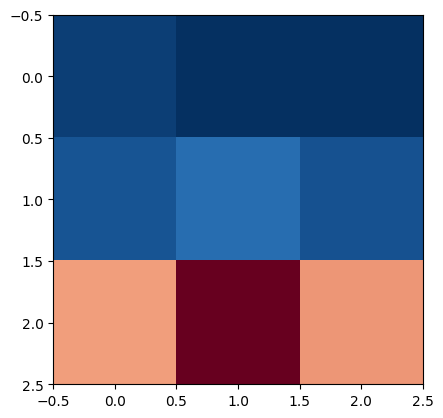

Layer: 1, Head: 0
tensor([[ 0.0218, -0.0165,  0.0100],
        [ 0.0397, -0.0220, -0.0539],
        [-0.0020,  0.0171, -0.0121]])
tensor([[0.3339, 0.3302, 0.3429],
        [0.3400, 0.3284, 0.3217],
        [0.3261, 0.3415, 0.3354]])
tensor([[-0.0012, -0.0051,  0.0167],
        [-0.0010, -0.0169,  0.0194],
        [-0.0335, -0.0144, -0.0124]])


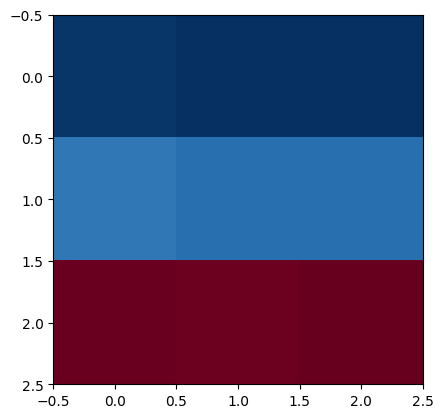

Layer: 1, Head: 1
tensor([[-0.0068, -0.0211,  0.0008],
        [-0.0415,  0.0651, -0.0070],
        [-0.0597,  0.0789, -0.0073]])
tensor([[0.3431, 0.3130, 0.3351],
        [0.3314, 0.3411, 0.3325],
        [0.3255, 0.3459, 0.3324]])
tensor([[-0.0129,  0.0116,  0.0097],
        [-0.0087,  0.0224,  0.0016],
        [-0.0050, -0.0327, -0.0005]])


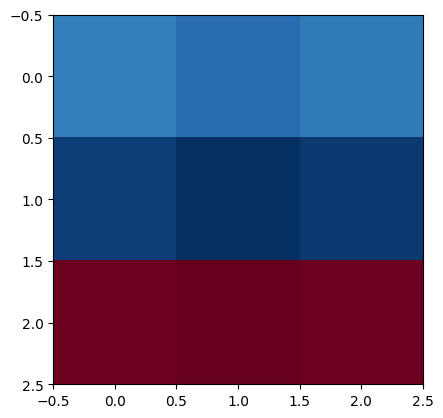

Layer: 1, Head: 2
tensor([[ 0.0211,  0.0104, -0.0157],
        [-0.0974,  0.0401,  0.0193],
        [ 0.0420, -0.0331,  0.0194]])
tensor([[0.3437, 0.3347, 0.3256],
        [0.3053, 0.3448, 0.3372],
        [0.3510, 0.3205, 0.3372]])
tensor([[ 0.0089, -0.0101,  0.0089],
        [ 0.0089, -0.0195,  0.0041],
        [-0.0249, -0.0379,  0.0209]])


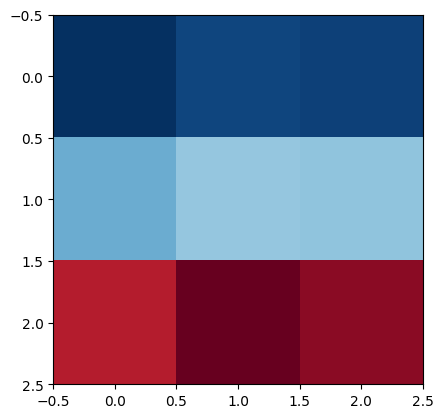

Layer: 1, Head: 3
tensor([[-0.1392,  0.1170, -0.0018],
        [-0.2918,  0.2669,  0.0474],
        [ 0.1589, -0.1433, -0.0358]])
tensor([[0.3119, 0.3410, 0.3314],
        [0.2678, 0.3961, 0.3482],
        [0.4203, 0.2629, 0.3204]])
tensor([[-0.0064, -0.0048,  0.0132],
        [ 0.0013, -0.0058,  0.0033],
        [-0.0096, -0.0307, -0.0011]])


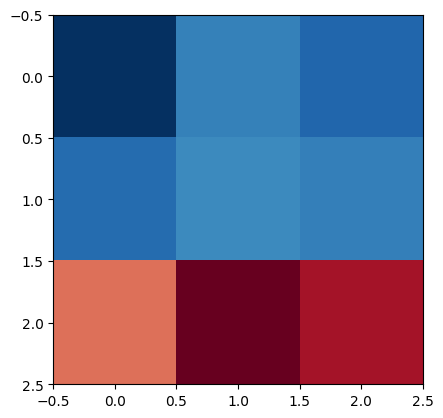

Layer: 1, Head: 4
tensor([[-0.0060,  0.1836, -0.0423],
        [ 0.0183, -0.1451,  0.0469],
        [ 0.0281, -0.0313, -0.0005]])
tensor([[0.3269, 0.3958, 0.3189],
        [0.3349, 0.2849, 0.3486],
        [0.3382, 0.3193, 0.3325]])
tensor([[ 0.0025,  0.0008,  0.0113],
        [ 0.0138, -0.0140, -0.0065],
        [-0.0375,  0.0223,  0.0076]])


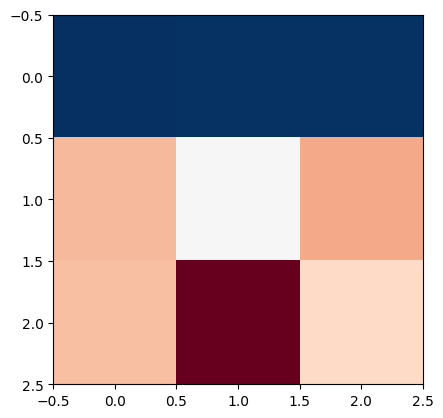

Layer: 1, Head: 5
tensor([[ 0.0666, -0.1550,  0.0366],
        [-0.0907,  0.2344, -0.0740],
        [ 0.0019, -0.0261,  0.0178]])
tensor([[0.3582, 0.2767, 0.3476],
        [0.3061, 0.4085, 0.3112],
        [0.3357, 0.3148, 0.3411]])
tensor([[ 0.0150, -0.0276, -0.0065],
        [ 0.0165, -0.0422,  0.0150],
        [-0.0163, -0.0126, -0.0103]])


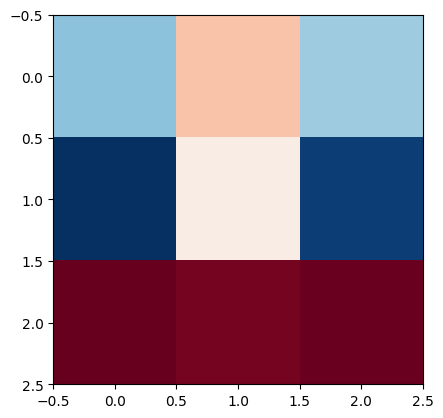

Layer: 1, Head: 6
tensor([[-0.0758,  0.0529, -0.0047],
        [-0.0220,  0.0077,  0.0359],
        [ 0.0441, -0.0196, -0.0170]])
tensor([[0.3142, 0.3465, 0.3301],
        [0.3316, 0.3312, 0.3438],
        [0.3542, 0.3223, 0.3261]])
tensor([[ 0.0069, -0.0031,  0.0077],
        [ 0.0081,  0.0067, -0.0004],
        [-0.0054,  0.0184,  0.0217]])


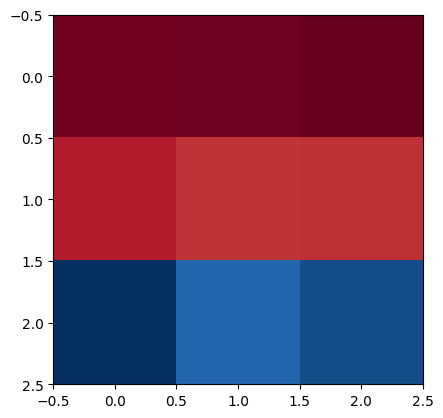

Layer: 1, Head: 7
tensor([[-0.0717,  0.0946,  0.0240],
        [-0.2150,  0.2794, -0.0087],
        [ 0.2420, -0.3222, -0.0258]])
tensor([[0.3091, 0.3494, 0.3425],
        [0.2679, 0.4203, 0.3315],
        [0.4230, 0.2303, 0.3259]])
tensor([[-0.0363,  0.0205,  0.0020],
        [-0.0035,  0.0034,  0.0062],
        [-0.0365, -0.0398, -0.0163]])


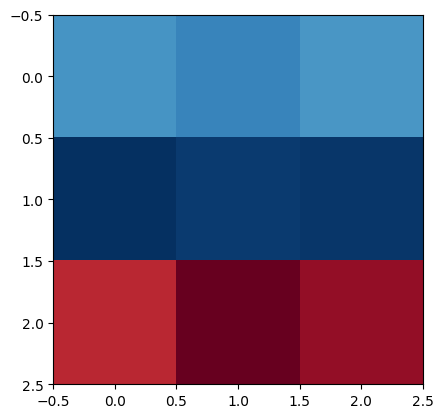

In [ ]:
# QK * OV

# QK circuit

# fig, ax = plt.subplots(cfg.n_layers, cfg.n_heads, figsize=(20, 5))
softmax_func = nn.Softmax(dim=0)

for layer in range(cfg.n_layers):
    for i in range(cfg.n_heads):
        print(f'Layer: {layer}, Head: {i}')

        # QK
        W_Q_headi = W_Q[layer][i,:,:].detach().cpu()
        W_K_headi = W_K[layer][i,:,:].detach().cpu()
        QK_circuit = W_E.detach().cpu() @ W_Q_headi @ W_K_headi.T @ W_E.detach().cpu().T
        print(QK_circuit)
        QK_circuit = softmax_func(torch.mul(QK_circuit, 1))
        print(QK_circuit)
        v_max = QK_circuit.abs().max()

        # OV
        W_O_i = W_O[layer][i,:,:].detach().cpu()
        W_V_i = W_V[layer][i,:,:].detach().cpu()
        OV_circuit = W_U.detach().cpu() @ W_O_i.T @ W_V_i.T @ W_E.detach().cpu().T
        print(OV_circuit)

        # out = QK_circuit @ OV_circuit
        out = torch.matmul(OV_circuit, QK_circuit)
        # v_max = max(v_max, OV_circuit.abs().max())

        # im = ax[layer, i].imshow(QK_circuit, vmax=v_max, vmin=-v_max, cmap="RdBu")
        # plt.imshow(QK_circuit, vmax=v_max, vmin=-v_max, cmap="RdBu")

        # fig, ax = plt.subplots(1, 2, figsize=(20, 5))
        plt.imshow(out, cmap="RdBu")
        # ax[1].imshow(OV_circuit, vmax=v_max, vmin=-v_max, cmap="RdBu")
        plt.show()

        # px.imshow(QK_circuit, color_continuous_scale="RdBu").show()
        # ax[layer, i].set_title("H_{}".format(i))

# plt.suptitle("QK circuits with embeddings")
# px.imshow()
# fig.colorbar()
# plt.show()


## Multiple head patching

###  Two heads

In [ ]:
# model_c0.cfg.use_attn_result = True
n_heads = model_c0.cfg.n_heads
n_layers = model_c0.cfg.n_layers

mt.show_prompt()

for pos in range(mt.n_pos):
    print(f"Position: {pos}")
    patching_effect = torch.zeros(n_heads, n_heads)
    for head1 in range(n_heads):
        for head2 in range(n_heads):
            fwd_hooks = [(
                f"blocks.0.attn.hook_pattern",
                partial(mt.patch_two_heads_result, head1=head1, head2=head2, pos=pos)
            )]
            prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
            patching_effect[head1, head2] = prediction_logits[mt.clean_pred] - prediction_logits[mt.corrupt_pred]

    px.imshow(patching_effect.detach(), color_continuous_midpoint=mt.ori_logit_diff, color_continuous_scale="RdBu").show()

Clean Prompt            : [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1], True Ans: 0, Model Pred: 1
Corrupt Prompt          : [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1], True Ans: 0, Model Pred: 0
Corrupt Index           : 4
Position: 0


Position: 1


Position: 2


Position: 3


Position: 4


Position: 5


Position: 6


Position: 7


Position: 8


Position: 9


Position: 10


Position: 11


Position: 12


Position: 13


Position: 14


Position: 15


Position: 16


Position: 17


Position: 18


Position: 19


### Three heads

In [ ]:
# three heads: head 4 + two other heads

model_c0.cfg.use_attn_result = True
n_heads = model_c0.cfg.n_heads
n_layers = model_c0.cfg.n_layers

mt.show_prompt()

for pos in range(mt.n_pos):
    print(f"Position: {pos}")
    patching_effect = torch.zeros(n_heads, n_heads)
    for head1 in range(n_heads):
        for head2 in range(n_heads):
            fwd_hooks = [(
                f"blocks.0.attn.hook_pattern",
                partial(mt.patch_head4_three_heads_result, head1=head1, head2=head2, pos=pos)
            )]
            prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
            patching_effect[head1, head2] = prediction_logits[mt.clean_pred] - prediction_logits[mt.corrupt_pred]

    px.imshow(patching_effect.detach(), color_continuous_midpoint=mt.ori_logit_diff, color_continuous_scale="RdBu").show()

Clean Prompt            : [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1], True Ans: 0, Model Pred: 1
Corrupt Prompt          : [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1], True Ans: 0, Model Pred: 0
Corrupt Index           : 4
Position: 0


Position: 1


Position: 2


Position: 3


Position: 4


Position: 5


Position: 6


Position: 7


Position: 8


Position: 9


Position: 10


Position: 11


Position: 12


Position: 13


Position: 14


Position: 15


Position: 16


Position: 17


Position: 18


Position: 19


In [ ]:
# three heads: head 6 + two other heads

model_c0.cfg.use_attn_result = True
n_heads = model_c0.cfg.n_heads
n_layers = model_c0.cfg.n_layers

mt.show_prompt()

for pos in range(mt.n_pos):
    print(f"Position: {pos}")
    patching_effect = torch.zeros(n_heads, n_heads)
    for head1 in range(n_heads):
        for head2 in range(n_heads):
            fwd_hooks = [(
                f"blocks.0.attn.hook_pattern",
                partial(mt.patch_head6_three_heads_result, head1=head1, head2=head2, pos=pos)
            )]
            prediction_logits = mt.model.run_with_hooks(mt.clean_prompt, fwd_hooks=fwd_hooks)[0, -1]
            patching_effect[head1, head2] = prediction_logits[mt.clean_pred] - prediction_logits[mt.corrupt_pred]

    px.imshow(patching_effect.detach(), color_continuous_midpoint=mt.ori_logit_diff, color_continuous_scale="RdBu").show()

Clean Prompt            : [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1], True Ans: 0, Model Pred: 1
Corrupt Prompt          : [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1], True Ans: 0, Model Pred: 0
Corrupt Index           : 4
Position: 0


Position: 1


Position: 2


Position: 3


Position: 4


Position: 5


Position: 6


Position: 7


Position: 8


Position: 9


Position: 10


Position: 11


Position: 12


Position: 13


Position: 14


Position: 15


Position: 16


Position: 17


Position: 18


Position: 19


## Logit Lens/Tuned Lens

* ref: https://arxiv.org/abs/2303.08112
* haven't done

In [ ]:
W_U.shape # torch.Size([3, 128])
cache['blocks.1.hook_resid_post'][0].shape # torch.Size([20, 128])

umembedding_mul_post = W_U @ cache['blocks.1.hook_resid_post'][0].T # torch.Size([3, 20])
logits_matrix = logits[0].T # torch.Size([20, 3])

# px.imshow(umembedding_mul_post.cpu().detach(), color_continuous_scale="RdBu").show()
# px.imshow(logits_matrix.cpu().detach(), color_continuous_scale="RdBu").show()

model_output = model_c0(random_sequences)
model_output_matrix = model_output[0].T

# px.imshow(model_output_matrix.cpu().detach(), color_continuous_scale="RdBu").show()

print(umembedding_mul_post[0])
print(logits_matrix[0])
print(model_output_matrix[0])

tensor([21.3607, 15.0503, 19.0741, 20.9619,  3.5177,  5.6332, -5.9069, -1.3819,
        -1.6119, -2.0476, -2.9052, -7.5907, -1.7962, -3.0419,  3.8588, -2.3201,
        -0.8967, -2.1530, -0.2704, -7.5520], grad_fn=<SelectBackward0>)
tensor([21.3400, 24.2132, 20.8757, 16.3501,  2.2494, 33.2155, 32.5398, 32.4287,
         7.5326, 30.7515, 28.5501, 17.0893, -7.4581,  8.5156, 29.6870, 31.8416,
        19.0066, -2.9766, 29.7788, 13.4812], grad_fn=<SelectBackward0>)
tensor([21.3400, 24.2132, 20.8757, 16.3501,  2.2494, 33.2155, 32.5398, 32.4287,
         7.5326, 30.7515, 28.5501, 17.0893, -7.4581,  8.5156, 29.6870, 31.8416,
        19.0066, -2.9766, 29.7788, 13.4812], grad_fn=<SelectBackward0>)
